In [1]:
import os
import random
import time
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
import shap
from lime.lime_tabular import LimeTabularExplainer

# -----------------------------
# Feature Extraction (Unified)
# -----------------------------
def extract_features(audio, sr, frame_size=1024, hop_size=512, n_mfcc=3):
    """
    Extract RMS, ZCR, Spectral Centroid, Bandwidth, and first 3 MFCCs
    for each frame of the audio signal.
    Returns array of shape (frames, 7).
    """
    rms = librosa.feature.rms(y=audio, frame_length=frame_size, hop_length=hop_size)[0]
    zcr = librosa.feature.zero_crossing_rate(y=audio, frame_length=frame_size, hop_length=hop_size)[0]
    centroid = librosa.feature.spectral_centroid(y=audio, sr=sr, n_fft=frame_size, hop_length=hop_size)[0]
    bandwidth = librosa.feature.spectral_bandwidth(y=audio, sr=sr, n_fft=frame_size, hop_length=hop_size)[0]
    mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=n_mfcc, n_fft=frame_size, hop_length=hop_size)

    features = np.vstack([rms, zcr, centroid, bandwidth, mfcc]).T
    return features


In [2]:
def train_anomaly_detector(normal_path, sr=16000):
    all_features = []
    for file in os.listdir(normal_path):
        if file.endswith(".wav"):
            audio, _ = librosa.load(os.path.join(normal_path, file), sr=sr)
            feats = extract_features(audio, sr)
            all_features.append(feats)

    all_features = np.vstack(all_features)
    scaler = StandardScaler()
    all_features_scaled = scaler.fit_transform(all_features)

    iso = IsolationForest(contamination=0.1, random_state=42)
    iso.fit(all_features_scaled)
    return iso, scaler


In [3]:
def detect_anomalies(file_path, iso, scaler, sr=16000, frame_size=1024, hop_size=512):
    audio, _ = librosa.load(file_path, sr=sr)
    feats = extract_features(audio, sr, frame_size, hop_size)
    feats_scaled = scaler.transform(feats)

    preds = iso.predict(feats_scaled)   # 1 = normal, -1 = anomaly
    scores = -iso.decision_function(feats_scaled)  # anomaly score (higher = more abnormal)

    times = librosa.frames_to_time(np.arange(len(preds)), sr=sr, hop_length=hop_size)
    return audio, sr, times, preds, scores, feats_scaled


In [4]:
def plot_anomalies_with_scores(audio, sr, times, scores, file_name="", percentile=90):
    threshold = np.percentile(scores, percentile)
    preds = (scores > threshold).astype(int)  # 1 = anomaly

    plt.figure(figsize=(12, 4))
    plt.plot(np.linspace(0, len(audio)/sr, len(audio)), audio, color="blue", alpha=0.6)

    for i, p in enumerate(preds):
        if p == 1:  # anomaly
            t0 = times[i]
            t1 = times[i+1] if i+1 < len(times) else times[i]
            plt.axvspan(t0, t1, color="red", alpha=0.3)

    plt.title(f"Waveform with Highlighted Anomalies: {file_name}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()


In [5]:
def explain_with_shap(iso, feats_scaled, feature_names):
    explainer = shap.Explainer(iso, feats_scaled)
    shap_values = explainer(feats_scaled)

    print("🔎 SHAP Waterfall for first anomalous frame:")
    shap.plots.waterfall(shap_values[0], show=True)

    print("🔎 SHAP Beeswarm (global feature importance):")
    shap.plots.beeswarm(shap_values, show=True)


In [6]:
def explain_with_lime(feats_scaled, iso, feature_names):
    explainer = LimeTabularExplainer(
        training_data=feats_scaled,
        feature_names=feature_names,
        discretize_continuous=True,
        verbose=True,
        mode="classification",
        class_names=["Normal", "Anomaly"]
    )

    idx = np.random.randint(0, len(feats_scaled))
    exp = explainer.explain_instance(
        data_row=feats_scaled[idx],
        predict_fn=lambda x: np.column_stack([(iso.predict(x) == 1).astype(int), (iso.predict(x) == -1).astype(int)])
    )

    print(f"🔎 LIME explanation for frame {idx}")
    exp.show_in_notebook(show_table=True)
    return exp


✅ Model trained on normal data

===== Iteration 1/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000017.wav


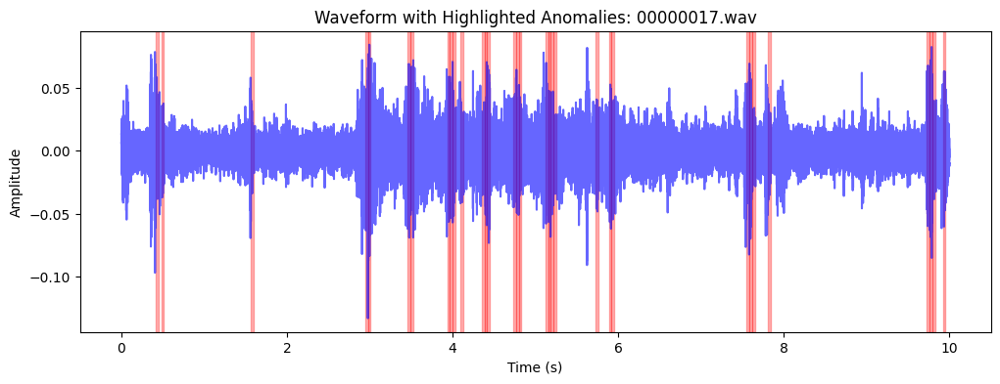

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


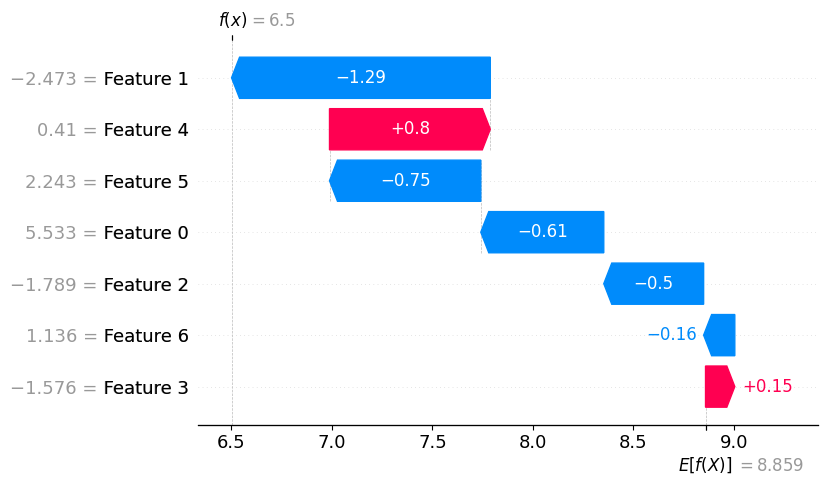

🔎 SHAP Beeswarm (global feature importance):


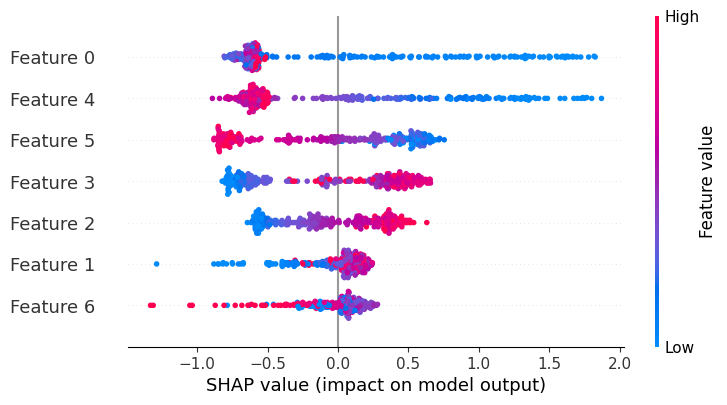

🔎 LIME Explanation
Intercept 0.9138594720389299
Prediction_local [0.77505522]
Right: 0
🔎 LIME explanation for frame 17



===== Iteration 2/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000125.wav


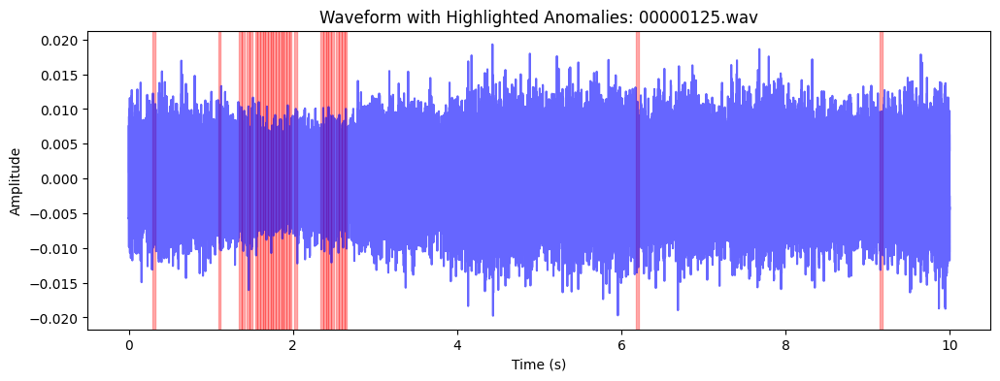

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


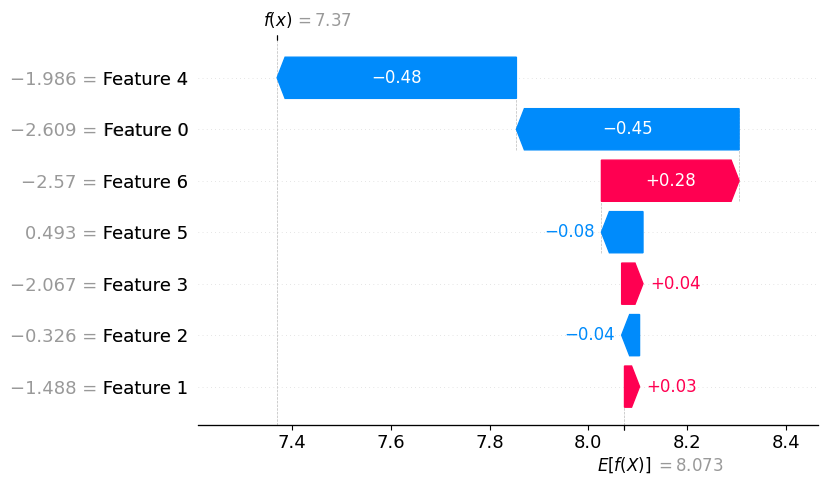

🔎 SHAP Beeswarm (global feature importance):


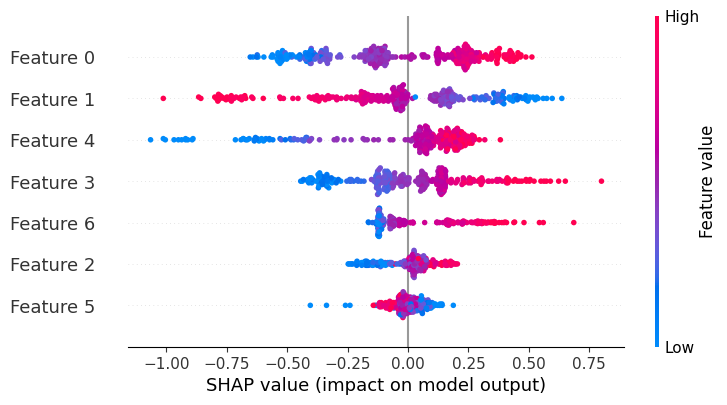

🔎 LIME Explanation
Intercept 0.9876182616456224
Prediction_local [1.0069769]
Right: 1
🔎 LIME explanation for frame 251



===== Iteration 3/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000041.wav


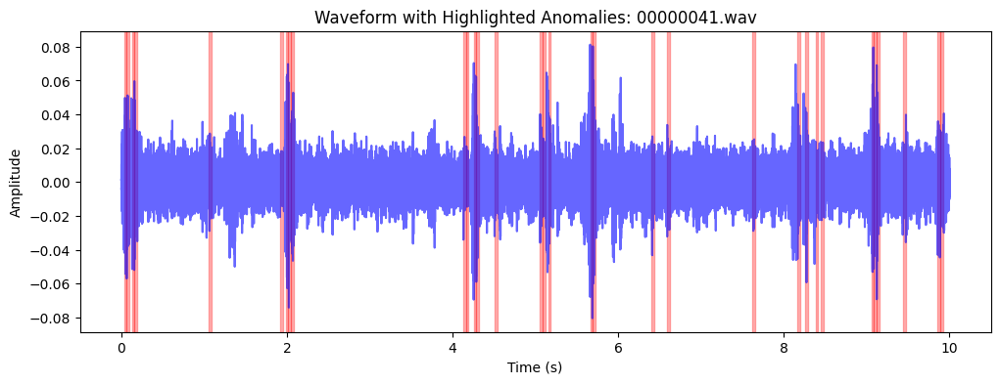

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


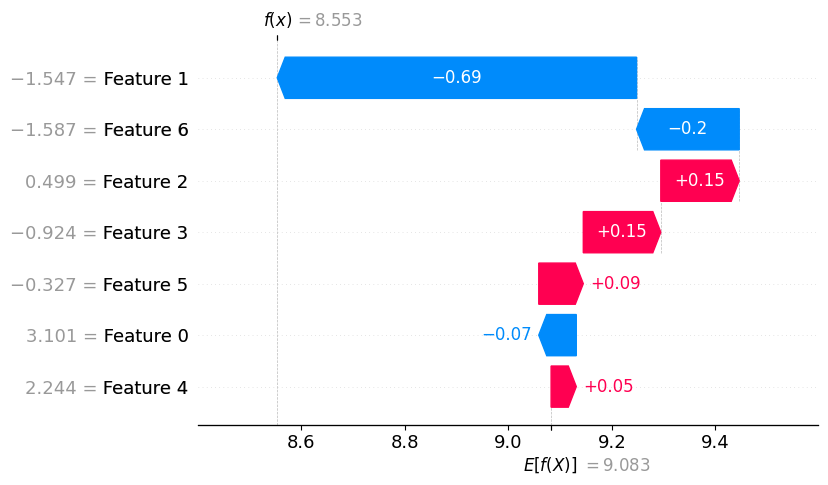

🔎 SHAP Beeswarm (global feature importance):


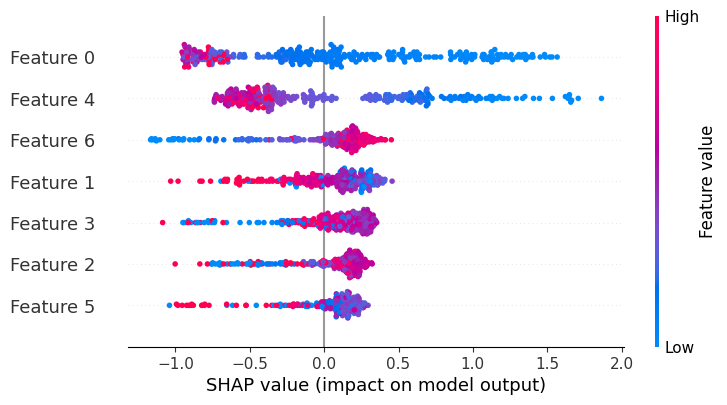

🔎 LIME Explanation
Intercept 0.7216605751219966
Prediction_local [0.85360403]
Right: 1
🔎 LIME explanation for frame 237



===== Iteration 4/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000114.wav


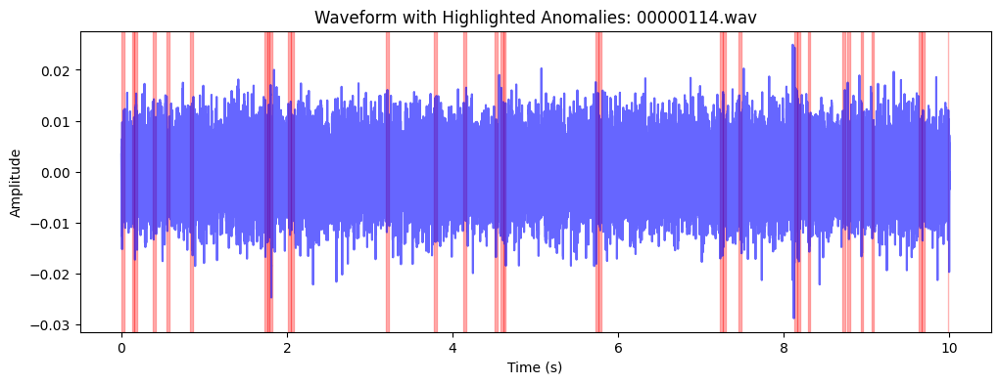

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


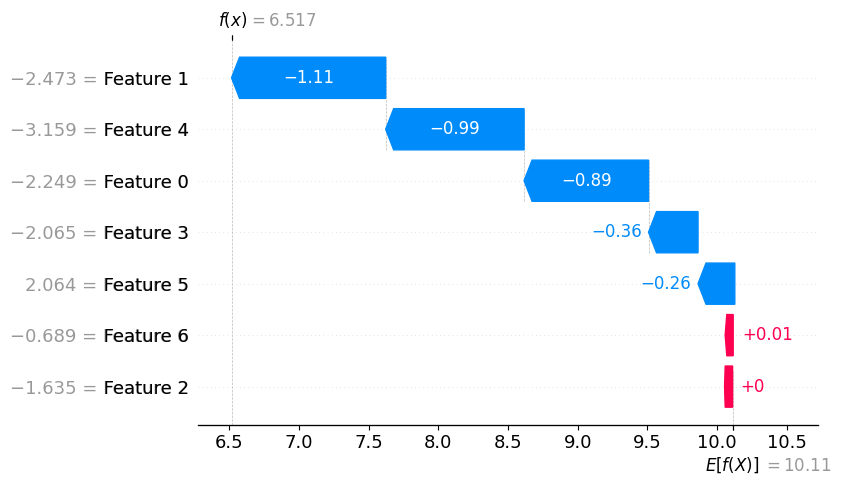

🔎 SHAP Beeswarm (global feature importance):


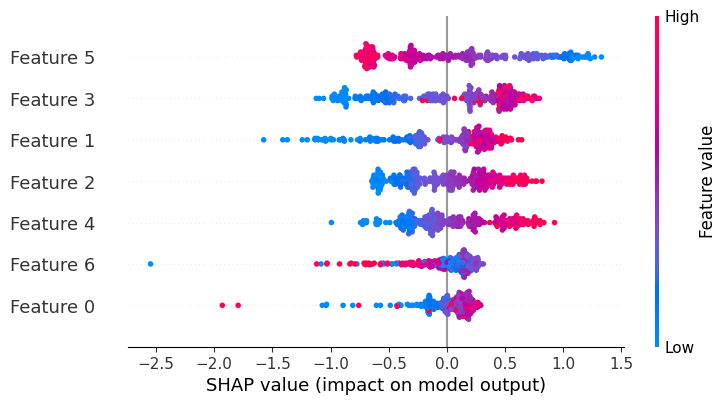

🔎 LIME Explanation
Intercept 0.5606664195125814
Prediction_local [-0.05715586]
Right: 0
🔎 LIME explanation for frame 124



===== Iteration 5/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000128.wav


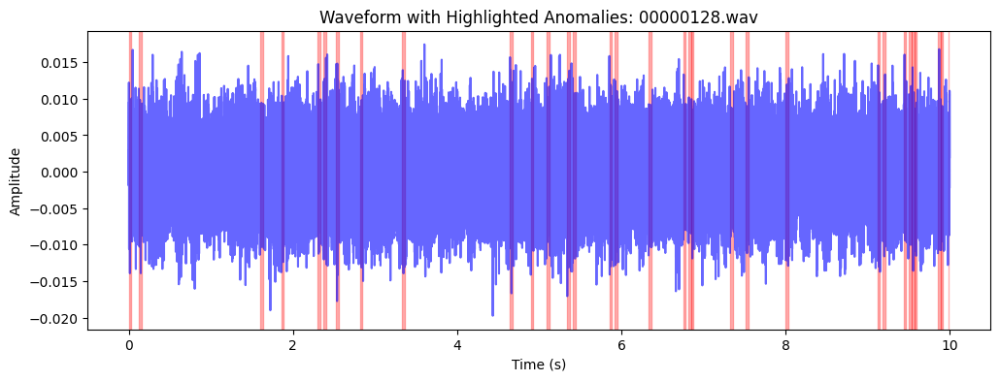

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


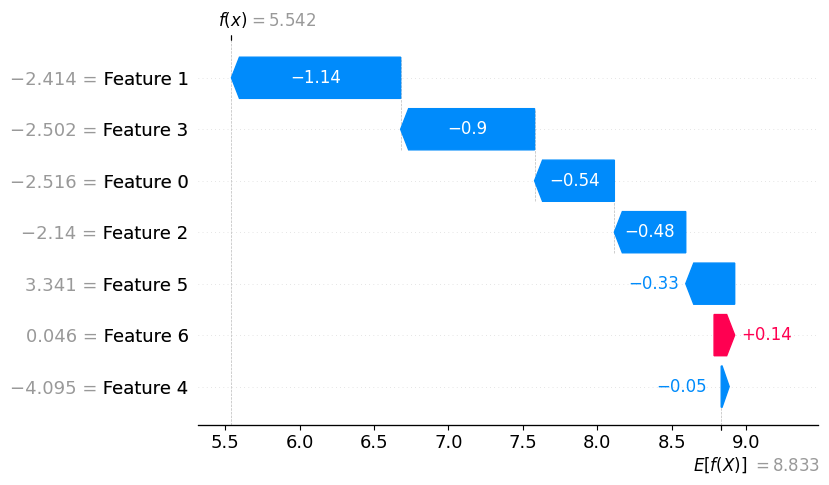

🔎 SHAP Beeswarm (global feature importance):


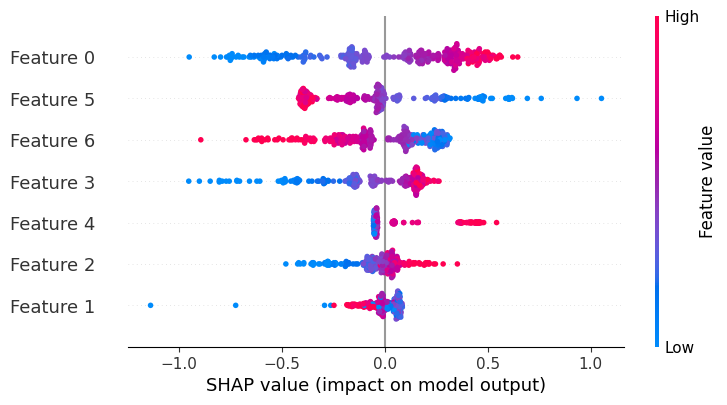

🔎 LIME Explanation
Intercept 0.9023024577804064
Prediction_local [0.85372659]
Right: 1
🔎 LIME explanation for frame 48



===== Iteration 6/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000122.wav


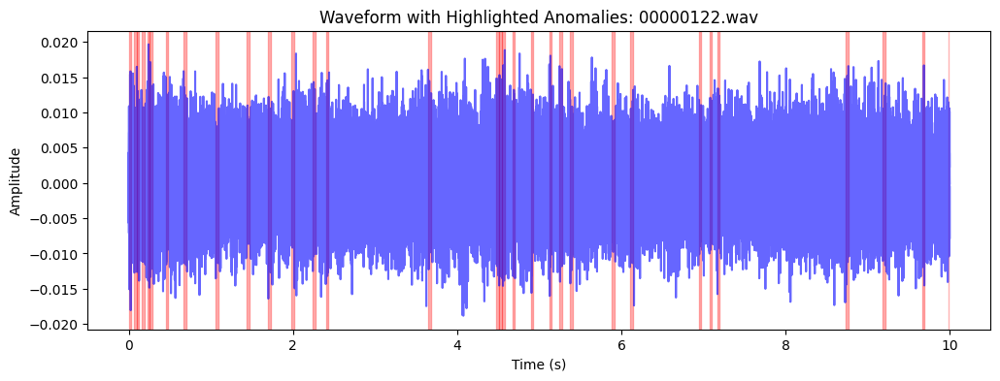

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


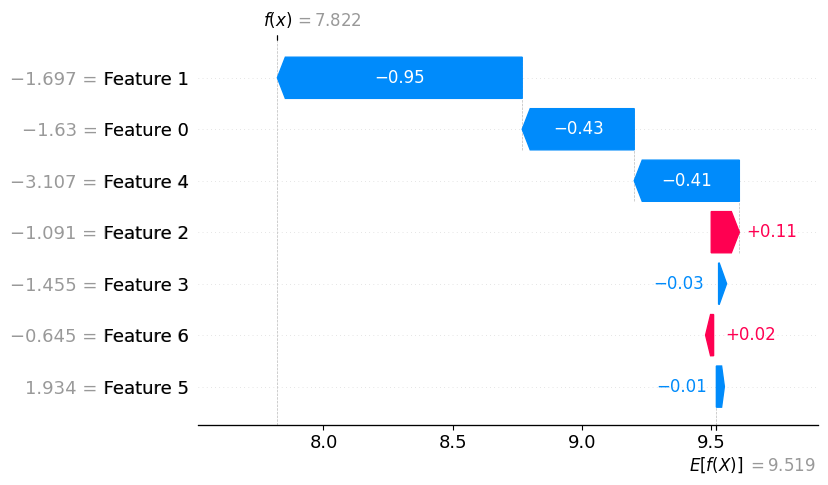

🔎 SHAP Beeswarm (global feature importance):


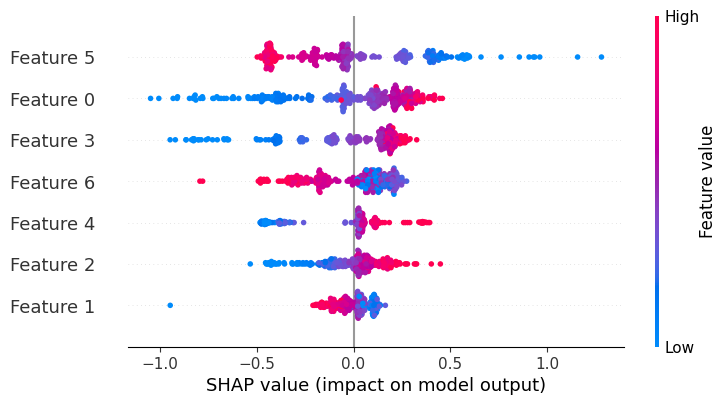

🔎 LIME Explanation
Intercept 0.7800279544581212
Prediction_local [-0.062026]
Right: 0
🔎 LIME explanation for frame 23



===== Iteration 7/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000040.wav


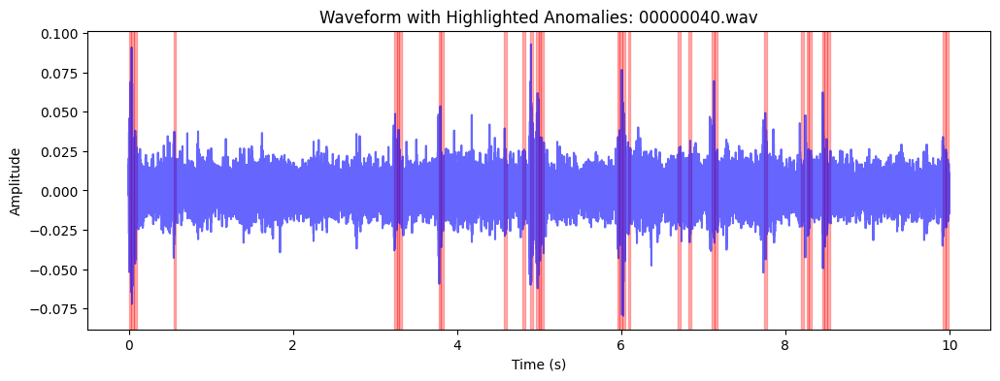

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


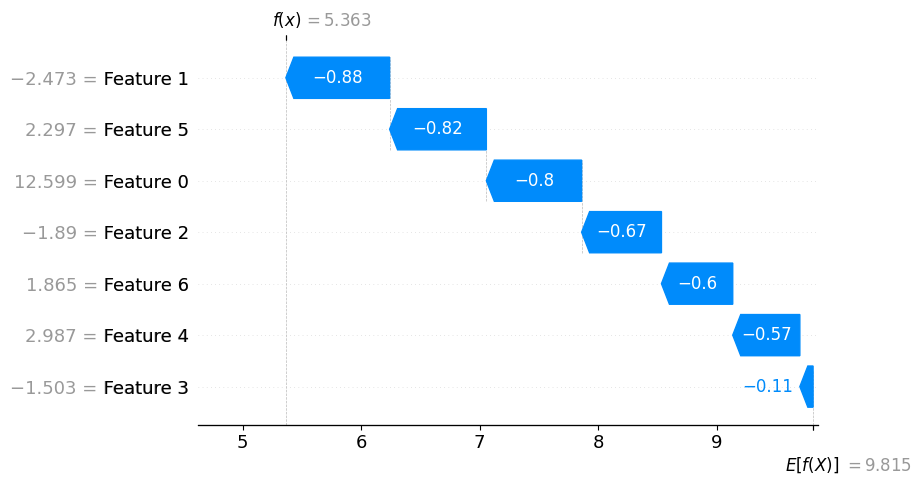

🔎 SHAP Beeswarm (global feature importance):


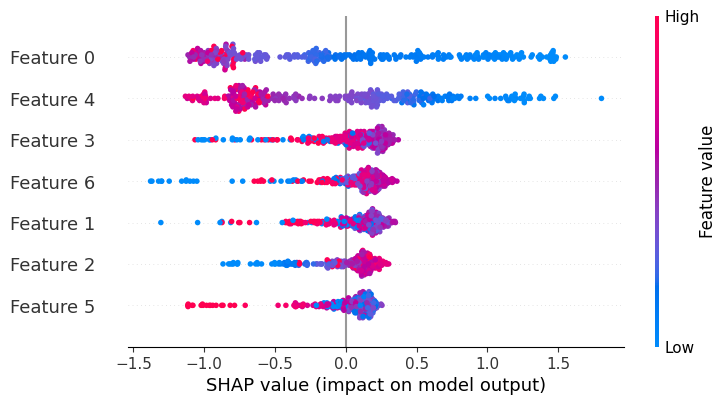

🔎 LIME Explanation
Intercept 0.9169005908442274
Prediction_local [-0.14877528]
Right: 0
🔎 LIME explanation for frame 171



===== Iteration 8/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000015.wav


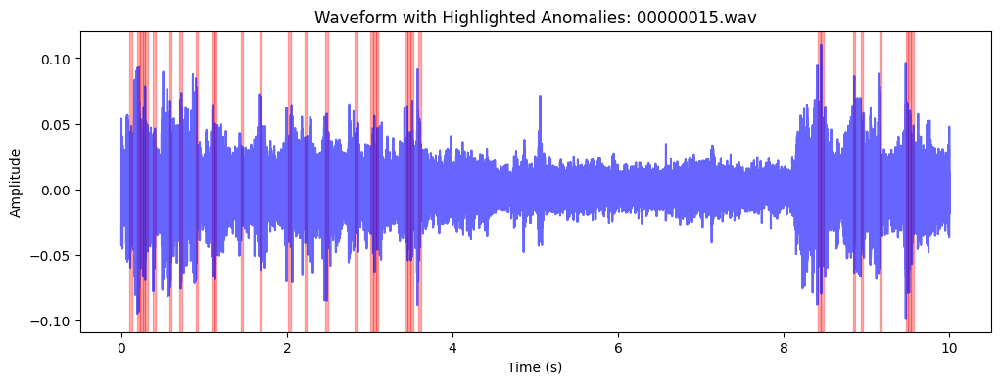

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


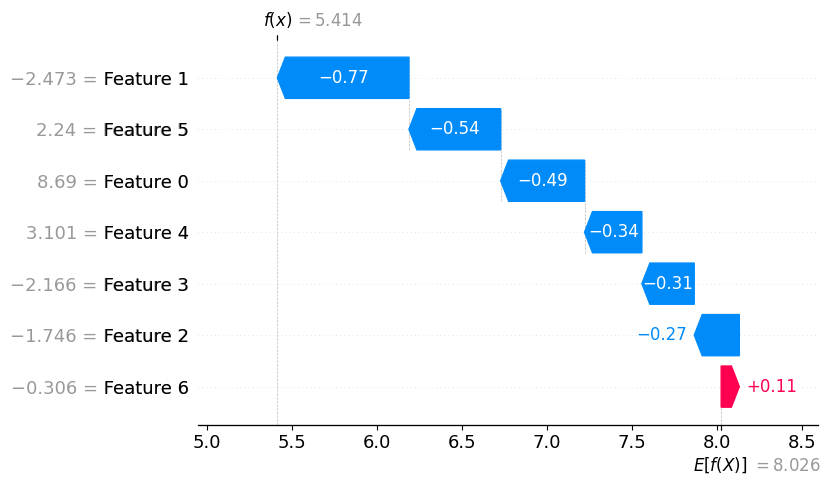

🔎 SHAP Beeswarm (global feature importance):


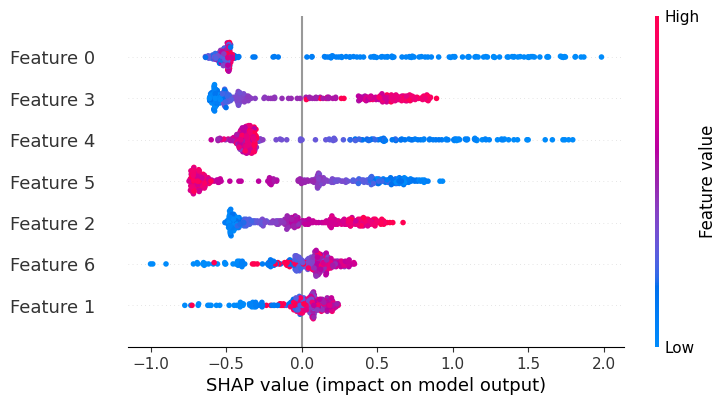

🔎 LIME Explanation
Intercept 1.032411958684248
Prediction_local [0.69743247]
Right: 0
🔎 LIME explanation for frame 161



===== Iteration 9/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000110.wav


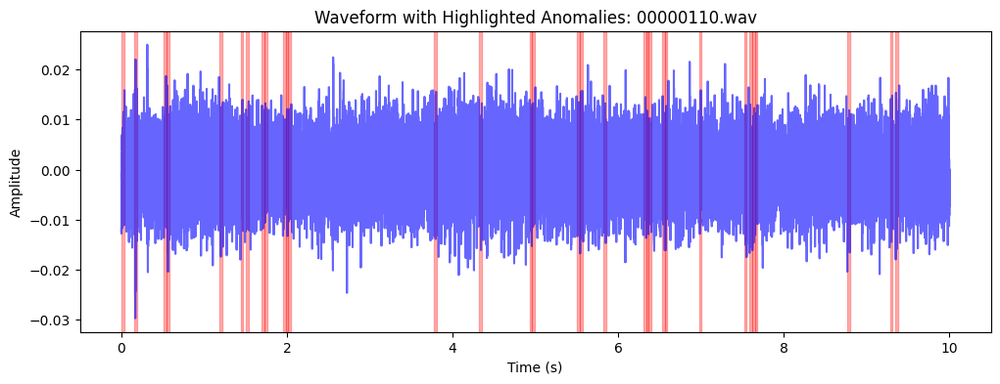

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


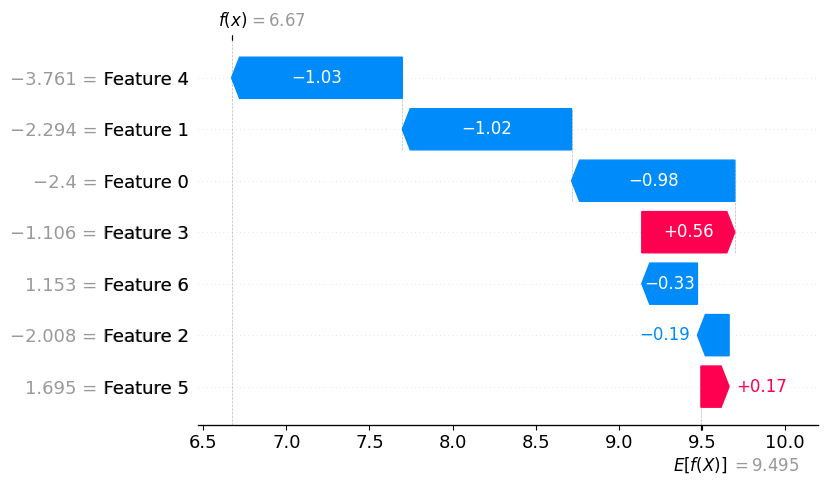

🔎 SHAP Beeswarm (global feature importance):


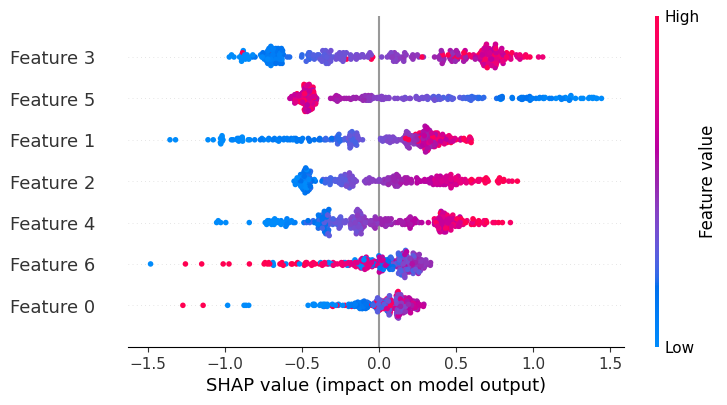

🔎 LIME Explanation
Intercept 0.5327042702235709
Prediction_local [0.72269773]
Right: 1
🔎 LIME explanation for frame 65



===== Iteration 10/3 =====

🎵 Testing file: /home/nadeem/Downloads/abnormal/00000132.wav


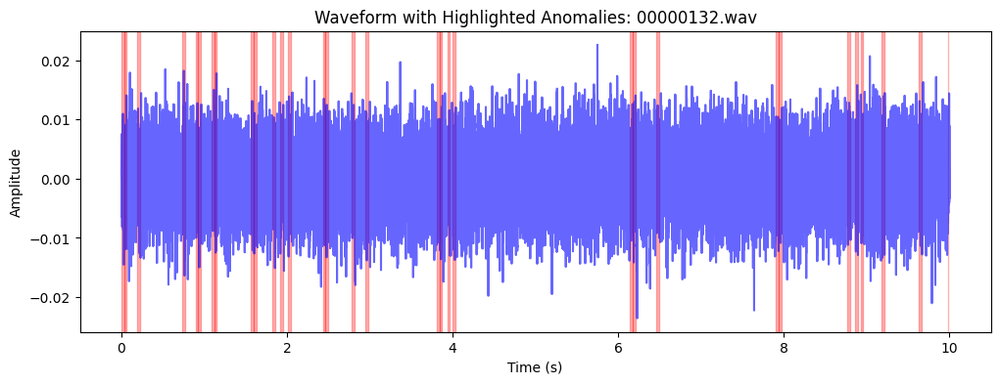

🔎 SHAP Explanation
🔎 SHAP Waterfall for first anomalous frame:


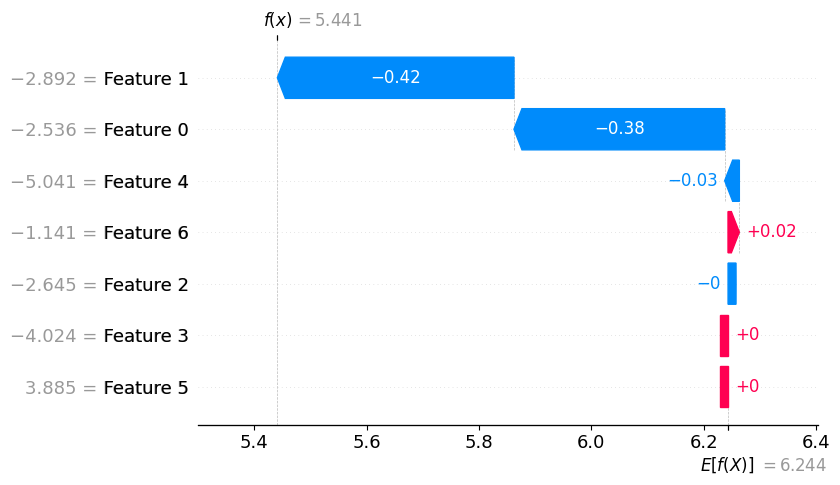

🔎 SHAP Beeswarm (global feature importance):


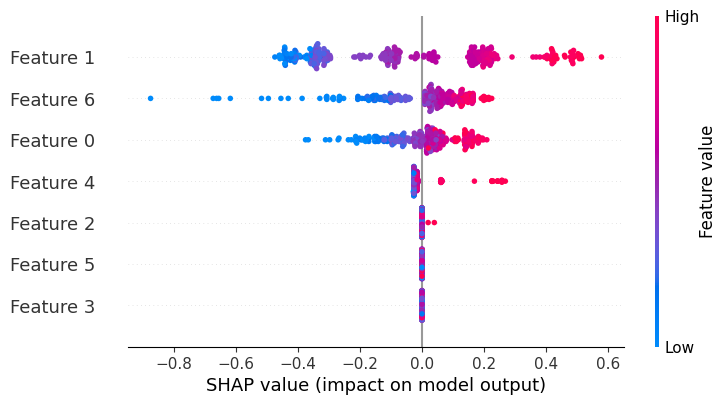

🔎 LIME Explanation
Intercept 1.0
Prediction_local [1.]
Right: 1
🔎 LIME explanation for frame 156


In [10]:
#normal_path = "/home/nadeem/Downloads/normal"
abnormal_path = "/home/nadeem/Downloads/abnormal"

# Train model
iso, scaler = train_anomaly_detector(normal_path)
print("✅ Model trained on normal data")

# Features
feature_names = ["RMS", "ZCR", "Centroid", "Bandwidth", "MFCC1", "MFCC2", "MFCC3"]

# Function: test a random filedata:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAzwAAAHlCAYAAAAwWPkgAAAAOnRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjEwLjUsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvWftoOwAAAAlwSFlzAAAPYQAAD2EBqD+naQAApQJJREFUeJzs3XdYVFf6B/DvnRmG3qRLUwQBASs2jCVqYixoTIymuEazicmmJ5rspuum/FZNL5tqYoxriiXGkqjR2LvSRJEiKCAd6W2Ymfv7Y2R0ZIABBy7g9/M8PDL3nrnnnQH1vnPOeY8giqIIIiIiIiKibkgmdQBERERERETthQkPERERERF1W0x4iIiIiIio22LCQ0RERERE3RYTHiIiIiIi6raY8BARERERUbfFhIeIiIiIiLotJjxERERERNRtMeEhIiIiIqJuiwkPERERERF1W0x4iIiIiIio22LCQ0Qm0Wq1eOutt9CnTx9YWFigT58+WL58OUJCQqDValt9vS+++AJ+fn6oq6trh2iJiIiIdARRFEWpgyCizu/TTz/F008/jUWLFqF///5wdHTEggUL8O6772LBggWtvl5tbS169eqFl19+GU8//XQ7RNzY3r17kZKS0uT5Bx54ALa2tk2eLysrw4kTJ5Cfn4/a2lrY2dkhMDAQAwYMgEKh0LcrKChASkoKcnNzUVFRAUtLS3h4eCAyMhJOTk6tbkdERERtx4SHiEwyZMgQuLq6YseOHQCADz/8EG+88Qby8/NhZWXVpmv+85//xM8//4yMjAwIgmDOcI3Kz89HeXm5wTFRFHHw4EHY29vjnnvuafK5lZWVWL9+PZRKJfr16wdLS0vk5+cjJSUF/v7+mDRpkr7tn3/+iby8PAQEBMDFxQXV1dU4c+YM6uvrceedd6JHjx6takdERERtp2i5CRHd7GpraxEfH4+lS5fqj3333XeYPn16m5MdAJg9ezaWL1+OPXv2YPz48eYItVkeHh7w8PAwOJaXlwe1Wo3AwMBmn5uamgqVSoXp06frE5HQ0FCIoojU1FTU1dXB0tISABAREYHx48dDLpfrn9+nTx+sX78ecXFx+tdqajsiIiJqO67hIaJm/f3vf4e1tTU0Gg1effVVCIIALy8vJCQkYOLEiY3aX7p0CVZWVnjooYcMju/atQsWFhZ47rnn9MeGDBmCHj164Lfffmv319GUtLQ0AGgx4VGpVAAAGxsbg+M2NjYQBAEy2dV/Tj09PQ2SGABwdHSEs7MzSktLW92OiIiI2o4JDxE164EHHsCjjz4KAPjoo4/www8/4LHHHgMADB48uFF7b29vPPzww1izZg0uXrwIADh37hzuueceTJ48Ge+9955B+8GDB+PQoUMtxqHValFbW2vSl6kzdbVaLc6fPw8PDw/Y29s327Znz54AgH379qGoqAiVlZU4f/48zp49i7CwMFhYWDT7fFEUUVNT0+KImKntiIiIyDSc0kZEzRo/fjx2794NW1tbPPnkk5DJZHjttdcAAL179zb6nJdeegnffPMNli1bhjfffBPTpk1Dr1698OOPPxqMhABAQEAAfvjhhxbjyMvLw9atW02K+b777msxgQGArKws1NXVISgoqMW2vr6+iIyMRGxsrD6RA4BBgwZh6NChLT4/LS0NVVVVGDJkiFnaERERkWmY8BBRixISEhAWFqZPVoqLi6FQKGBnZ2e0vbe3Nx555BF8/fXXiImJQU1NDfbt22e0ApqzszNqampQXV3daLrYtVxcXDBlyhST4rW2tjapXVpaGmQyGQICAkxqb29vDy8vL/Tu3RtWVlbIzMxEbGwsrK2tER4e3uTzSktLcfDgQXh4eKBv37433I6IiIhMx4SHiFoUHx9vUIXMFIsXL8ann36KhIQEHDhwAN7e3kbbNUw/a6lKm6WlJXx8fFoVQ3Pq6+tx8eJF+Pj4mDR9LC0tDfv378ecOXP0iV7v3r0hiiKOHz+OwMBAo9eprq7GH3/8AaVSiYkTJzYa4WptOyIiImodJjxE1KzS0lJkZWUhIiJCf8zFxQVqtRoVFRVNTh17++23AQBqtbrZ8solJSWwsbFpcVRGo9GYvEmplZVViwnDhQsXTKrO1uDs2bNwdXVtNKrl7++PlJQUFBUVNUrIVCoV/vjjD311t6b2+DG1HREREbUeEx4ialZCQgIAoH///vpjISEhAICMjAyD4w1WrFiBb775Bp9++ileeOEFvP322/jmm2+MXj8jIwOhoaEtxpGfn2/WNTxpaWmwsLBAr169TLpmTU2Nvuz0tbRaLQA0KpSgVquxfft2lJWVYerUqXB2djZ6XVPbERERUdsw4SGiZsXHxwMwTHhGjhwJADh58mSjhGfTpk3417/+hTfffBNPPPEEUlNT8d///hevvPKK0SIHMTExeOCBB1qMw5xreGpqapCdnY3AwEAoFI3/GVSr1aisrISVlZV+mpqjoyOys7NRWloKJycnfdvz589DEASDUSytVovdu3cjPz8fkyZNarT3T2vbERERUdsJoqn1W4nopvTII4/gjz/+QHZ2tsHxiIgIREREYO3atfpjp06dwpgxY3D33Xdj9erVAICcnBwEBARg7ty5jUZ5Tp06hcjISOzatQsTJkxo/xdzRWJiIg4fPozJkyfD19e30fmcnBxs3boVgwcPRmRkJAAgNzcXW7duhZWVFcLCwmBpaYnMzExkZWUhJCQEY8aM0T//8OHDSExMhJ+fH/r06dPo+g1V4UxtR0RERG3HER4ialZCQoLRaWsPPfQQXn/9ddTU1MDa2hrZ2dmIjo7GoEGD8PXXX+vb9ezZEw899BC++eabRqM869atg5+fH8aPH98hr6VBWloarK2tmyykYIyXlxdmzJiBU6dO4cyZM6irq4O9vT2GDh2KAQMGGLQtLi4GAGRmZiIzM7PRtRoSGVPbERERUdtxhIeI2qSsrAwBAQFYvnw5/v73v7f6+XV1dejVqxf+9a9/4ZlnnmmHCImIiIgA1j0lojZxdHTEiy++iBUrVugX7rfGd999BwsLCzz22GPtEB0RERGRDkd4iIiIiIio2+IIDxERERERdVtMeIiIiIiIqNtiwkNERERERN0WEx4iIiIiIuq2mPAQEREREVG3xYSHiIiIiIi6LSY8RGQ25eXlGDduHMrLy6UOhYiIiAgAEx4iMqPy8nLs27ePCQ8RERF1Gkx4iIiIiIio22LCQ0RERERE3RYTHiIiIiIi6raY8BCR2Tg4OGDkyJFwcHCQOhQiIiIiAIAgiqIodRBE1H3ExcVh4MCBUodBREREBIAjPERkZvb29lKHQERERKTHER4iMqva2lpYWVlJHQYRERERAI7wEJGZnTt3TuoQiIiIiPSY8BARERERUbfFhIeIzMrHx0fqEIiIiIj0mPAQkVmp1WqpQyAiIiLSY8JDRGaVl5cndQhEREREekx4iIiIiIio22JZaiIyK7VaDYVCIXUYRERERAA4wkNEZnb+/HmpQyAiIiLSY8JDRGZVU1MjdQhEREREekx4iMisbG1tpQ6BiIiISI9reIjIrOrq6mBpaSl1GEREREQAOMJDRGaWlJQkdQhEREREeiylREQdJqtcxMrTWqnDIKJWmOgvwy0+gtRhEBG1Gae0EZFZFRQUwN3d3ei5Vw9q8M5REQqOLRN1CRoR6GGpReGTSqlDISJqM47wEFGHUGtFfJ0gQgRQz0Eeoi5Dzb+vRNTF8XNWIjKrnJwco8d3ZIgoqO7gYIjohgmczUZEXRwTHiLqEF8laCHnjRNRl6PVcIiHiLo2JjxEZFahoaGNjuVVidiWrlsPQERERNSRmPAQkVllZmY2Orb6jAiWRyHqmuRyudQhEBHdECY8RGRWVVVVBo9FUcSX8VpwUgxR16TV8m8vEXVtTHiIyKysra0NHh+8BKSXSRQMEd0w7l5BRF0dEx4iMqs+ffoYPP7mtBYKFisg6rpYpo2IujgmPERkVomJifrvy+pE/HxOhJofEBN1WVzDQ0RdHRMeImo3P50TodJIHQUR3QiNWi11CEREN4QJDxGZlaenp/77L+O52JmIiIikpZA6ACLqXhQK3T8rCYUiYgskDoaIbpgg42ejRNS1MeEhIrPKzs6Gq6srvknQFSvg+p2ux9ESWD5GhplBAmwsgOO5Ihbt1ZqcwD4xSMATA2UIcASKaoCfk0W8dkiL6vqrbfwdgAsLjf8XdO8WDX5O5i9OZ8GaBUTU1THhISKzq1WL+P4MixV0RQKAbXfJMcANWHFCi6Ia4PGBMuydI8eQHzRIK23++f8ZI8M/h8mwLlmLj2JE9HMR8NQgAWEuMtyxofEUx7VJWvyebviLciSXvzidiVbDqalE1LV1aMJz9uxZ5OXlobCwEOXl5RBFEQsXLmz1dbRaLc6ePYvk5GSUlZVBEAQ4ODggNDQU/fr1M2h76dIlxMXFoaCgAFqtFs7OzggPD0ffvn0N2iUnJ2Pfvn3N9vvAAw/A1ta21fHeiIqKCtx///3YunWr0fNKpRJ1dXXt1v+JEyfw7bffYs6cORg3bly79WMOv/76K9auXYuzZ88iIyMDNTU1eOONN7BkyRKpQ7uphISEYFOaiHKV1JFQW8wKFjDKW8CszRpsSNElHr8ka5DydzmWjpLhgW1N3/x62gLPDxGw+owWD/7R0E5ESomATyfIMS1AxNbrkpuYfBH/S2KCQ0RE7adDE564uDjU1dXBxcUFarW60Y7sptBoNNixYwdycnIQGBiIfv36QavVoqysDJWVlQZt09LS8Ndff8He3h6DBg2CQqFARkYG9u7di6qqKgwaNEjf1svLC7feemuj/qqrq3Hs2DG4uLh0eLJzvWeeeQY+Pj4Gx3r06NGufcbHx+OLL76Ah4dHp094fvvtN2zYsAGenp7o1asXkpKSpA7ppnTp0iV8Ge8PmQBoeR/b5czqKyCvSsTGlKs/vKIa4JdkEXP7CVDK0WTlvZE9BVjIBfx0zjAp+umciE8nAPeGCI0SHgCwsQDqNUA9BxI6JRnLUhNRF9ehCU90dDTs7OwgCAK2b9/epoQnJiYGly5dwtSpU9GzZ88m22m1Whw+fBjW1ta46667YGlpCQAICwvD9u3bcerUKfTp0wcODg4AAAcHB/3314qNjQWg+9RaanPnzkVkZKTUYZhNQ6Lq7OxslustWbIEH374IZycnPCf//wHL730klmuS61zrqAWe7OkjoLaapC7gJh8EdenJcdzRTw6QIa+zkBikfHnWl65L665ropxw9qdIR6NF4O8ESXDu+MEaEURp/KBVw5o8edFZsqdiSgyEyWirq1DS6/Y29tDuIHVj/X19UhMTIS/vz969uwJURShUhmfN3P58mXU1taiV69e+mQHAARBQFBQELRaLdLS0prtTxRFJCcnQy6XIzAwsM1xd5Tz58/jwQcfhLe3NywsLGBra4tx48bpk7YGmZmZWLBgAUJDQ+Ho6AiFQgF3d3fMmzcPxcXF+navvvoqHnnkEQDA0qVLIQgCBEGAr6+v/rwgCFi1apXB9XNychAVFWXws05OTkZwcDB8fX2xefNmDB8+HPb29voRKlEUsW/fPkyaNAkuLi5QKBRwcXHB3LlzUVBg2krpXr16wcnJqbVvG5nZ1nxXyLnIucvysgVyjXwW1XCsp13TP9zky7pEZZS34fHRPrrneNtfPaYVgR0ZWrywT4vojRo8t0cLdxvgj7tlmBLAX6DORORQLRF1cV2qaEFeXh7q6+vh5uaGw4cPIzk5GfX19bCyskJISAgiIyMhu1I+U6PRzbloKJF7rYZj+fn5zfaXm5uL8vJyBAYGGiRNzVGpVNBqTfs0TKFQGI2vKYWFhcjOztY/lslk6NGjB6ysrJCQkIB77rkH6enpiI6ORlhYGHJycrB582aMHDkSBw8e1I8OnTlzBuvWrcOECRMwffp0yGQyHDlyBGvXrsWJEycQHx8PpVKJGTNmICsrC6tXr8Ztt92G22+/HQD0CU9blJWV4aGHHsKQIUPw/PPPo7a2FgDw008/4fHHH4coirj77rvh4+OD+Ph4bNiwAYcOHUJcXBwcHR3b3C91DI1WxMYcF2h4f9QpCACUJs5GqrsyTc1acfX7a9Wqr55vSmwBcDRHxD+HyXCpUos9mSJCXQR8PlEGlUY0eG5WBRoVMfjhrAZnF8jx3lgZfk/njrWdBsu0EVEX16USntLSUgDA6dOnIZfLMXz4cFhaWiItLQ1xcXGoqqrSr8NxcnKCIAjIycmBKIoGow05OTkA0OKUunPnzgFo3XS2HTt2IDc316S2gwcPbtUUtSlTpjQ69vnnn2PevHl4++23kZKSgu3bt2PSpEn683/++SfmzJmD5557DgcOHAAATJgwAYWFhbC2tta3q66uxpNPPonvvvsOmzZtwuzZszF06FCMHj0aq1evRlRUFBYvXmxyrE2pqKjASy+9hHfeeUd/LCMjA8uWLYNMJkN8fLx+nZJWq8W7776Ll156Ce+//z6WLl16w/1T+/orU0RBtdRRUIMxvgL2zjEt4wn5Vo3ky7rpaJZGnmJ15X+L66erXe/uzRr8PE2O7+7QXUStFfH+SRFjfQUEtzB7taQW+C5RxEvDZfC2Ay5VNt+eOoaca3iIqItrVcJTV1eH06dPm9w+PDwcVlZWrQ6qKfX19fo47rnnHv30pT59+mDLli1ITU3FwIED4ezsDEtLSwQHB+PcuXPYu3cv+vfvry9a0JDIqNVN/89dV1eHjIwMODg4NLtW6HojRowwuWqasTVDzXnrrbcQEBCgf6xQKBAVFYX09HQcPXoUgYGBCAsLMxgF8vDwQL9+/XDkyBHU1NTA2toaSqVSf762thalpaVQq9UYPXo0vvvuOxw7dgyzZ89uVWyt8eKLLxo8jouLQ0JCAubNmwcABvEPGTIEbm5u+OOPPzo04bl8+TJsbW31I3uVlZUQRRH29ro5OSqVChUVFXBxcdE/Jzc3F15eXk0+zsvLg4eHhz757o59BDkLAEToxhZIaueKRcz/w7SRktwryUVulW5a2/UajuVUNj98l1MJjP5Jg0AnXdW21BIgvxq49JgcKSUtx5FVobt+DysmPJ2FRq3G5cvl3e7fK/bBPthH9+jDFK1KeFQqFWJiYkxuHxQUZNaEp2H6l7u7e6O1Gn379kVubi5yc3P1i+CjoqIA6NaPpKamAgCsrKwwZswY/PXXX7CwsGiyr7S0NGg0mlYXK3Bzc2tV+9aYNGmS0RGhjIwM5Obmor6+vtnpZkVFRfD19UV5eTlWrFiBtWvX4uLFi/rpfw1KSky4K2kjFxeXRj+7pKQkiKKI77//Ht9//73R55nz98gU11e/s7OzM3isVCoN/jICaPSX7/rHnp6e3b6PXo4CojzqcaxAyWltnUB+NfD9mdb9IOIKRIz2EdCQujYY7iWgql40KWkBgLRS6PfsCXXRrf1ZldjydN8AR91/ioU1rYma2lt3/PeKfbAP9tE9+jBFqxIee3v7Nu2bYy4NZaFtbGwanWs4du3oikKhwJgxYzB8+HCUlJRAJpPBxcUF5eXlANDsAvfk5GQIgtBov56W1NbWmryGx8LCotmky1SiqLst6du3b5N7ztjY2MDNzQ319fV47bXX8PHHHyMsLAxvvPEGfH19YWlpidTUVLzxxhsmx9+wXup6Wq22URLV4NppdNfHf9ddd2HWrFlGn3f9XxjqvB4KVeNwvrLlhtQprU8RcU+wDHf1FfT78LhYA/cEC9hyXjQoSR1wZVldelnT1xMALB8jQ1W9iC/ir/7b4mqtK3d9rZ52wEPhAuILROS1vogntROhiX/riYi6ii61hqdh9MTY2puGY8ZuqC0tLQ1umDMzMwEAfn5+RvspKipCUVER/P39jSZXzfnzzz/bbQ1PUxwdHeHu7o6SkhLMmTOnyUQEAC5cuID9+/fD0tISx48fN3h9n376aaP2zVXVaxhJu3z5ssHxiooKFBU1UbfWiKCgIAiCAJlMhvvuu8/k51HnFCHLgIMyjBuPdlHrU0QcyRHx3R0y9HPRoqgGeHygDHIBeOOQ4Ychu2fr1nb0/vpqFvThrTJYKXQjRRYy4P5QGYZ5AQ/+oUVWxdXnLh8rQx9HAbsztcip1I0OPtpfgK0F8MwelkHuTG6kuioRUWfQaROe6upqqFQq2NnZ6aeyOTg4wMPDA/n5+SgqKoKrqysA3YhCUlISBEFotDHn9crLyxEfHw9HR0eD9TDXakuxggbtuYanKQEBAYiKisK6devw7rvvNlojo1KpUFRUhJ49e+oTC0EQDEZysrKy8MMPPzS6dsOcymvLVTcICgqCXC7Hjh078PzzzwPQVcfbuHEjMjIyTI4/MjIS4eHh+PXXX3H06FGMGDHC4HxVVRWqq6vbdbogmY9SJmJ+uID/xopQc1pbl6MVgSkbNFgxVoanB8lgbQGcyAPm/6ExaTpbbIGIZ4fI8ECoAK0IHM8TMeEXEXuzDH8Zdl4Q8dgAAU8MksHZEiitA/Zni3jrqBaxplWipw6i1WgA3PhsBCIiqXRownPx4kX9jXNZmW4ORMOaIKVSifDwcH3b48ePIyUlBdOmTTMoGjBq1Chs3rwZ27ZtQ1hYGKysrHD+/HkUFhZi8ODBBnMBz549i8zMTHh6esLKygqlpaU4d+4cZDIZJk6caLTyjFqtRlpaGmxsbNpUflmKm3I7Ozu8/vrrOHPmDP75z3/it99+w6hRo6BUKpGRkYGjR4/C29sb+/fvh6enJ0aMGIGYmBgMHz4cM2fORFlZGXbu3Gl0GlpgYCDc3d2xZs0aODo6wtXVFT4+Ppg1axYiIyMxcuRI7Ny5E5MnT0ZkZCTi4+OxZ88eeHt7GxQfaE5AQABeffVV/OMf/8Do0aMxbdo0hIeHo7a2FqmpqTh8+DAef/zxJqfrNTh16hRWrlwJQDclEQC2bduGgoICKJVKPPTQQ+jfv3/r3lxqtb59++LhKhk+jmFZ4a6qtA54ZKcWj+xsvt21IzsNvj8j4vszLf/sfzon4qdz/B0hIqL216EJT0ZGBlJSUgyOnTx5EoDupv3ahKcprq6umDFjBk6cOIHExERoNBo4OTlh7NixCA4ONmjr7OyM8+fPIyEhASqVCjY2NggMDMSgQYP064Gud+HCBahUKvTr16/ZqWGdTXh4OHbs2IF33nkH27dvx0cffQRAVyRg0KBBePLJJwHopvf9+9//hlwux4YNG7Bs2TLY29tjypQpmD17NmbMmGFw3f79+2Pp0qV4//33sWLFCqhUKn3C4+npiY8//hiLFi3CgQMH8NdffyEsLAxr1qzBsmXLTE54AGD27Nnw8/PDsmXLcOTIEWzduhVKpRLu7u762FoSGxuLzz//3ODYyZMn9b9jAwcOZMLTAfLz8xHRuzcGu+v2ZeEgD1HXJmNZaiLq4gSxYcU4EZEZxMXFYeDAgfgqXovH/tQy4SHq4pyUGpQ8bdrm20REnVHXGcIgoi6hofLgvSEClPxgmKjLE7X82IKIujYmPERkVmFhYQAAB0sB94YIULDAE1HXxr/DRNTFMeEhIrOKi4vTf/9IfxkrtRF1cXJ5py3oSkRkEiY8RNRuonoCfRyljoKIboRGo5Y6BCKiG8KEh4jMqmF/LEC3YeGjA2T8h4aoK+MoLRF1cbwPISKzunYvLACYFyaAG7UTdV1CF9qigYjIGP4rRkRmdeHCBYPHHrYCpvUB5Ex6iLokgZ9YEFEXx4SHiNrdwv4yaDgthqhL0mo0UodARHRDmPAQkVkFBgY2OjaplwAPGwmCISIiopseEx4iMqvi4uJGx+QyAY/0FzitjagLksm5gzARdW1MeIjIrEpKSoweXxDOaW1EXZEo8i8uEXVtTHiIyKzkTXwaHOAkYJwvIOMoD1GXImq1UodARHRDmPAQkVlFREQ0eW5hfxm0/LCYqEsJdqiVOgQiohsiiByrJiIzSkhIQP/+/Y2e02hFVKg6OCAiuiF2SkDBoVki6sIUUgdARN2LtpnpL3KZACerDgyGiG5YYmIiwsPDpQ6DiKjNOKWNiMyqR48eUodARGakVqulDoGI6IYw4SEis3JycpI6BCIyI/6dJqKujgkPEZlVenq61CEQkRm5urpKHQIR0Q1hwkNERERNSktLkzoEIqIbwoSHiMyqd+/eUodAREREpMeEh4jMqry8XOoQiMiMevXqJXUIREQ3hGWpicisiouL4evrK3UYRGQmVVVVTRYu0GhF1DddiZ46AQuZbksAopsZEx4iMitB4H+sRN1JYWEhvL29jZ5bfkLEyweY8XRm4/2A3bN5u0c3N05pIyKzGjBggNQhEFEHEEURX8Yz2ensjudKHQGR9JjwEJFZJSYmSh0CEZlRUx9i7MsScZFL9jo9URSlDoFIckx4iMisuCs7UfeSlJRk9Pg3p0UoOIO10xNFjsIRMeEhIrPiruxE3YtKpWp0rLRWxLpkEWoOHhBRF8CEh4jMiruyE3UvDg4OjY6tTWJ1tq5CJuOtHhH/FhCRWXFXdqLuxdPTs9GxLxOY7XQVXMNDxISHiIiImpGSkmLwODZfREIhwNvoroEJDxETHiIyM+7KTtS9fXNay2IFXQp/WERMeIjIrKqqqqQOgYjMyM/PT/99Tb2I1WdYrKAr4RoeIiY8RGRmhYWFUodARGZUV1en/35jqojKegmDoVbTajVSh0AkOSY8RERE1KT8/Hz991/GayHjDCki6mIUUgdARN1LU7uyE1HXllYi4sAlqaOg1hIEZqhEHOEhIrNqald2IuqaIiIiAADfJmoh72L3zo6WwJe3yVDwuByVz8jx12wZBrm3/joKGXBmgRziYgUWRRq+CV62wA9TZDj3kBzlT8tR8qQcxx6QY15YZ3mzOkscRNLhCA8RmZWxXdmJqOtKTU1FYN9gfJMgQtOFihUIALbdJccAN2DFCS2KaoDHB8qwd44cQ37QIK3U9Gs9NUiAn73xc67WgI+9gPUpIjLLRVjIgdv8BXw/WY5gZy1eOSjtnkWiyD2TiDp1wnP27Fnk5eWhsLAQ5eXlEEURCxcubPV1tFotzp49i+TkZJSVlUEQBDg4OCA0NBT9+vXTt0tJSUFaWhpKSkpQW1sLCwsLfbugoCDJKp3Mnz8f33//vdFzFhYW7XqDmZWVhTfffBNTp07FjBkz2q0fc0lKSsJTTz2FY8eOoa6uDn5+fnjhhRfw6KOPSh3aTcPYruxE1HXV1tZie4aIwhqpI2mdWcECRnkLmLVZgw0pukztl2QNUv4ux9JRMjywzbREwM0GeH2kDMuOa/HmLfJG508XAbf+bFgY4LNYEZtnAk8PFvDaIUDbhRJFou6oUyc8cXFxqKurg4uLC9RqdZvK3Wo0GuzYsQM5OTkIDAxEv379oNVqUVZWhsrKSoO2RUVFUCqV6NevH6ytrVFfX4/MzEzs27cPeXl5GDt2rLleWps8+eST8Pf3NzimVCrbtc+cnBx8/fXXUCqVnT7huXDhAsaOHYvy8nLMmzcPPXv2xLp16/DYY4+hsrISixYtkjrEm4KxXdmJqOuyt7fHVwm66WxdaYRnVl8BeVUiNqZcDbqoBvglWcTcfgKUckBlQgGz/4yWIbkEWJMk4s1bTO//QhlgEwAo5UCtug0vwExYlpqokyc80dHRsLOzgyAI2L59e5sSnpiYGFy6dAlTp05Fz549m20bFRXV6FhERAT++OMPJCcnY+jQobCxsWl1DOZy7733YtSoUZL13x6Ki4vh4uJilmv985//RGFhIdasWYMHHngAAPCvf/0LYWFhWLJkCRYuXAh7+ybmJJDZpKSkYODAgVKHQURmInfyxrb0rjdKMchdQEy+iOvDPp4r4tEBMvR1BhKLmr/GUE/gwTABt/yogdjC67dSALYWgJ0FMNZXwIJwAUdypE12AEBsKXCim0CnTvvt7e1vqLpIfX09EhMT4e/vj549e0IUxTZN/2q4Se7saxMqKirwj3/8Az4+PrCwsICtrS1GjhyJAwcOGLSrra3FP/7xD4SFhcHR0REKhQKurq646667DMqPrl69GiNGjAAAfPbZZxAEAYIgwMPDQ39eEAR88MEHjWKZMGFCo59dv3794OHhgZMnT+KWW26BnZ0dXF1d9eeTk5Mxffp0uLi4QKFQwNnZGXfeeScuXWq5LFB9fT3+/PNPeHl56ZMdALCyssL8+fNRWVmJn376yYR3kYiIrvXBgRaygk7KyxbINfI5acOxnnYt3198MkGOn5NFHM1tub9nBgsoekKBCwsV+H6yHEdzRdy7Vfo9cJjwEHXyEZ4blZeXh/r6eri5ueHw4cNITk5GfX09rKysEBISgsjISKNDvSqVClqtFnV1dcjKykJycjIcHR1NWpug1WpblRhZWVmZ3LaoqAjZ2dkGx3r06AEbGxtUVVVh5MiRSE5Oxh133IHBgwfj8uXL+OWXXzBx4kTs3LlTPyWvtLQUq1evxq233orJkyfDxsYGJ06cwObNmxETE4OUlBQolUpERUXh2WefxYcffojRo0dj+vTpAAAnJyeTY75edXU1br/9dgwaNAiLFi3Sb1IZGxuL8ePHQ6PRYObMmejTpw+Sk5OxceNGDB06FGfOnIGzs3OT101KSkJJSQnuuOOORufGjRsHADh8+DAeeeSRNsdOprl2V3Yi6tpEUcT67B6Sj+4I0E0NM0XdlRzDWnH1+2s1jLhYt3AHND9cQIQrMGuzaWt9fjwn4mSeBm42wLQAAR62LffRMViljahT/FVsL6WlpQCA06dPQy6XY/jw4bC0tERaWhri4uJQVVWFW2+9tdHztm7diqKiq59oeXt7Y/To0SbNg83Ly8PWrVtNjrE1RRjuvPPORsfefvttvPzyy3jppZdw5swZ/PLLL7jnnnv05//1r3+hf//+eOaZZxAXFwcAcHV1RUFBAWxtbQ2u9eqrr+Ltt9/G999/j0ceeQSBgYG499578eGHH6J///5YvHixybE2pbKyEo8++ii++OILg+MLFy6EVqtFXFwcAgIC9Md/++033HXXXXjttdfw6aefNnndjIwMADA6bbHhejk5OTccP7Xs2l3ZiahrO5AN5NS271pRU4zxFbB3jmkZT8i3aiRfBmrUgKWRp1hdufOpaWaqmb0S+L/RMqw4ISK7wrQYM8uBzHJdZvjTORFf3ibDrnvkCP5WwzU8RBJr178FdXV1OHnypMlftbW1Zu2/vr5eH8fUqVPRr18/9OnTB5MmTYKXlxdSU1NRUlLS6Hm33HILpkyZgnHjxiEgIEA/2mMKFxcXTJkyxeSv1li6dCnWrl1r8DVnzhyIoojNmzfDx8cHI0eORHZ2tv5LFEUMGTIEp0+fRk2NrsSOQqHQJzv19fXIz89HdnY2pk2bBgA4ePBgq+JqrXfeecfg8YULF3Dq1CnceuutUCqVBvEPHjwY7u7u2LNnT7PXbFjfZWlp2ehcw2tteP2muHz5ssHPvLKyEhUVV//XU6lUKC4uNnhObm5us4/z8vIMphZ01z5ycnK6xetgH+yDfYhILOoc06HOFYuY/4fGpK/cK/WIcqt009qu13Asp7Lp17Z4qAxKGfBzshb+DoC/A+BzZQmos5UAfwfAooU7qPUpIvwcBIzxkXaERavVDXN1pt8r9sE+zNmHKQSxHSd3VlRU4McffzS5/Zw5c+Do6Gj03Pbt25GZmdmqEZGEhAQcPXoUHh4ejSqMJScnY9++fbjlllsMSlMbc/z4cSQmJmLWrFmSlNxtKEt98OBBo0ULampq4OjoqE/wmpKZmQlfX18AwHvvvYcvvvgCGRkZ0GgMx/yjo6OxefNmAMCxY8cwYsQIPPHEE41GWFavXo0HH3wQ77//Pp577jmDcxMmTMBff/1l8Ever18/XLp0CWVlZQZtN27ciLvvvrvZ2D09PZv9Bf/tt99w55134qGHHsLKlSsNzl26dAk+Pj64/fbbsWPHjmb7oRsXFxfHogVE3URRtQjPz9XQiF1vWtQv0TKM9hHQ83ONQeGCL2+T4YF+Anp8qmmyStt3d8gwP7z5jGbg92rEFzZ9fnofAb/NlGP2Fg3WJUuXONrINah6rvGHgUQ3k3ad0mZvb9+mfXPMpeGTfWOV1RqOmTJy07dvX8TFxekrtTVHo9G0akqPOaq+NSQVvXr1ajR6ci03NzcAwPvvv4/Fixejb9++eOWVV9CrVy9YWVmhuroaDz/8MLRa0+YrNzdMfn0S1cDYmqWG+O+44w7MmzfP6PNaqq7Wu3dvAManraWnpwMwPt2NzK9hV3Yi6vpcbQTc6laOvYWOUHeOwR6TrU8RcU+wDHf1FfT78LhYA/cEC9hyXjRIdgKufNaafuXzuI9jtNiUZviC3W2Ar26X47tELX5LE5Fxpa2rta7c9fX+HiFAK4qIyZf2jbuR4k9E3UW3XsPTcINvrJx1wzFra+sWr6NW6ybfmpLI5Ofnt9sanqZYW1vDw8MDpaWlmDNnTovzdX/++WdYWFggJibGYB2PsWljzf1D2fD+XrveqYEpldUaREREQBAE1NfX47777jP5edcKDQ2Fs7Mz4uPjG53bu3cvAGDkyJFtuja1TmpqKkJCQqQOg4jM5LkoB+zaJHUUrbc+RcSRHBHf3SFDPxctimqAxwfKIBeANw4ZfrC3e7ZusU/vr3VZUGwBEFtgmKj4X5ngcaZIxG/XJEOvjJBhlLeA7RkiMstF9LAG7g6SYZiXgI9jtDhf2n6v0SRMeIi6T8JTXV0NlUoFOzs7KBS6l+Xg4AAPDw/k5+ejqKhIXwJZq9UiKSkJgiDAx8dHf0ylUhkdgUhMTAQAuLu7txhHwxqejiQIAqZPn47//ve/eOWVV/B///d/jdpcuHABvXr1AqAbmREEwWAURqPRYOnSpY2e1zDF8PLly43OhYWFQSaT4a+//jI4/ssvv+D8+fMmxx8UFIRBgwZh79692L17NyZMmGBwXqPRICcnRz8dzxgLCwtMmDAB69evx//+9z99aera2lqsWrUKtra2uPfee02OidrO3GvxiEhaAZoMeNsF4FJly207E60ITNmgwYqxMjw9SAZrC+BEHjD/Dw1SGi/fbbNt6SL6OAEPhQtwsxFQqwYSCnX9fH9G+mEx0cRZG0TdWadOeC5evKhfuNSw7iMmJgYAoFQqER4erm97/PhxpKSkYNq0aQZTl0aNGoXNmzdj27ZtCAsLg5WVFc6fP4/CwkIMHjwYdnZ2AHSL9//3v/+hV69e6NGjB6ytrVFdXY2LFy+isLAQ3t7eCAwMbDFmS0tLfRLVkZYvX45Dhw7hP//5D3bv3o3Ro0fD3t4eFy9exKFDh2Bra4vY2FgAwIwZM3D06FFERkbinnvuQV1dHf744w+jI1h9+vSBu7s7tm3bhpdeegkeHh5wcnLC/Pnz4ePjoy95PXHiRNxyyy04d+4ctm7dCj8/P1y8eNGk2AVBwLfffosJEyZg0qRJmDx5MgYMGAC1Wo309HTs3bsXs2fPbrZKW8N7sGfPHjz88MPYv38/vLy8sH79eqSnp2P58uWSrL+6GXFzV6LupbamGo/0l+HNI1popL9/b5XSOuCRnVo8srP5dg0jO825WA4I7zYut7broohdF7vYG0N0k+nUCU9GRgZSUlIMjp08eRIAYGdnZ5DwNMXV1RUzZszAiRMnkJiYCI1GAycnJ4wdOxbBwcH6dgqFAmFhYcjNzUV2djZUKhUsLCzg7OyMUaNGITQ0tFOXdrS1tcXRo0fx2muv4ddff9UnBz169EB4eLjB/jMvvvgiqqqq8N1332H58uWws7PD2LFj8f7776NPnz4G11UoFPj666/x4osv4v3334dKpYK7uzvmz58PAPjhhx/w4IMP4sCBAzhw4ACCgoKwfv16rFixwuSEBwAGDBiAkydP4qWXXsLevXuxfft2WFhYwM3NDbfeequ+v+b07t0b+/btw9NPP421a9eitrYWfn5++Oyzz/D444+bHAvdGG9vb6lDICIzsrW1xYIAAUsPSx0JtUVnvnch6ijtWqWNiG4+rNJG1L2oVCoolUrctk6NPZnocqM8NztbhRaVz0q/lxKRlJj2ExERUZPOnj0LAHi0v4zJThfEz7WJmPAQkZlJsYaNiNrf9EABTtzOhYi6ICY8RGRWTe3BRERdU0MhIKVcwIJwAQpWOe5SZDK51CEQSY4JDxGZVW5urtQhEJEZXbsf298jZF1uA9KbnVbLD6GImPAQERFRk67dSDrMVUCkByDjKA8RdSFMeIjIrMLCwqQOgYja0WMDZdBylKfLuHaEjuhmxYSHiMwqIyND6hCIyIxCQ0MNHs8OFmDVqXfxo2sx4SFiwkNEZlZdXS11CERkRllZWQaP7ZUC7g9h8YKuQqvVSh0CkeSY8BCRWdna2kodAhGZUWVlZaNjD/dn8QIi6jqY8BCRWfn7+0sdAhGZkZWVVaNjI7yAvs4SBEOtJpPxVo+IfwuIyKwadmUnou4hMDCw0TFBEPDoABlvIroAUeRQHBH/rSIiIqImJSYmGj3+t34Cy1N3AUx4iADWWSEis2rYlZ2Iujc3GwHTA4FNaYCciU+npBW5ZxIRwISHiMyMJVCJuhdPT88mz708XI5AJ1YB68wm+FtIHQKR5JjwEJFZXbp0CW5ublKHQURm0lzCM8RTwBBPeQdGQ62lm5IYLnUYRJLiGh4iIiKibkqtVksdApHkmPAQkVldvys7ERFJx8nJSeoQiCTHhIeIzOr6XdmJiEg6rq6uUodAJDkmPERkVsZ2ZSciImmkpaVJHQKR5JjwEJFZGduVnYiIiEgqgsgdqYjIjNRqNRQKFoAkIuoMSktLuY6Hbnoc4SEis2pqV3YiIup4VVVVUodAJDl+DEtERETUTRUWFsLb29vouZh8ET+c5caxUhvqKeD+UI5BtCcmPERkVs1tUkhERJ3H8uNarEsRIRekjuTmpRUBjShiZqAAawv+INoLEx4iMisLCwupQyAioisGDBhg9HhxjYgNqSK0ou6mm6TFH0H74vgZEZkV9+EhIuo8kpKSjB7/X5IIDWez0U2CCQ8RERFRN6VSqRodE0URX8RpOapANw0mPERkVsHBwVKHQEREVzg4ODQ6djIPSLosQTBEEmHCQ0RmlZubK3UIRER0hbFCMt+c1kLB9fF0E2HCQ0RmVV5eLnUIRER0RUpKisHjKpWINWdFqDmfjW4iTHiIyKwsLS2lDoGIiJqwPkVEtVrqKIg6FhMeIjIrruEhIuo8/Pz8DB5/Ga+FjNPZ6CbDhIeIzCohIUHqEIiI6Iq6ujr998mXRRzJ5b47dPNhwkNERETUTeXn5+u/X3laCzlHd+gmxISHiMzK3d1d6hCIiOg69RoRK0+L0HB0h25CTHiIyKysra2lDoGIiK6IiIgAAGxNF3G5VuJgiCTChIeIzOrixYtSh0BERFekpqYCAL5O6PzT2RwtgS9vk6HgcTkqn5Hjr9kyDGrDpAGFDDizQA5xsQKLIhu/6JeHC/jtThny/qFr80YUb4e7O/6EiYiIiLqp2tpaXKoQsT0DnXo6mwBg211y3B8q4NNYLV7cp4W7jYC9c+QIdGrdtZ4aJMDPvunzb4+WY6ingNiCTvyGkFkpOqqjmpoaHDt2DEVFRaiqqoJarYatrS28vLwwcOBAODo6mnSd7OxsZGRkoKioCJcvX4ZGo8G0adPQs2dPo+1VKhVOnDiBjIwM1NXVwcHBAWFhYQgNDYUgXM36T548iZiYmCb7FQQBjzzySOtetBnk5OTg0UcfxdatW42et7S0RG1t+41RHzp0CD/++CNmzZqFcePGtVs/5lZdXY1XX30VH3zwAQDgxIkTiIyMlDiqm0NQUJDUIRAR0RX29vZYdUaEIABiJ76/nxUsYJS3gFmbNdiQogv0l2QNUv4ux9JRMjywTWvSddxsgNdHyrDsuBZv3iI32qbXV2pcLAdcrIGiJ/jZ/82gwxKeuro6lJWVwcfHB3Z2dlAoFCgrK0NycjLS09Nx5513wtnZucXrpKWlIS0tDc7OznByckJxcXGTbTUaDbZt24aioiKEh4fDyckJWVlZOHjwIKqrqw1ugHv37m006SouLkZCQgL8/f3b9sLN6JlnnoGPj4/BMTc3t3bt8+TJk/jss8/g6urapRKeXbt2YfXq1bC0tDQoyUntr7CwELa2tlKHQUREALx6euPLXdpOX4p6Vl8BeVUiNqZcDbSoBvglWcTcfgKUckClafk6/xktQ3IJsCZJxJu3GG9zsdxMQVOX0WEJj5OTE2bMmNHoeO/evbFp0yacOXMGt9zSxG/mNYYOHYrRo0dDLpcjPj6+2YTn3LlzKCwsRFRUFMLDwwEAoaGh2LlzJ+Li4hAcHAx7e92Yp4uLC1xcXBpdIzc3FwAQEhJi0utsT3Pnzu1WoxRarRZlZWUmJbqtceHCBXz88ceQy+UYPXo0du3aZdbrU/NKS0ulDoGIiK5YcyQLWRW9pQ6jRYPcBcTki7g+LzueK+LRATL0dQYSi5q/xlBP4MEwAbf8qOnUo1nU8SQfx2tIOEz9FN7W1hZyufEhyuulpaVBoVA0SlYiIiKg1Wpx/vz5Zp9fX1+P8+fPw9bWttHISmd09uxZzJ07F97e3rCwsICtrS0mTJiA2NhYg3apqal48MEHERISAkdHRygUCri7u2PBggUGCeSiRYvw7LPPAgCWLl0KQRAgCIJ+tGvRokUQBAGrVq0yuH5ycjKioqIaTRkMDg6Gn58f1q9fj2HDhsHe3h49evQAoBuN27lzJ26//Xa4uLhAoVDAxcUF8+bNQ0FBgcnvgUqlwg8//IC9e/fizTffhJWVVWveQjIDCwsLqUMgIqIrNl5yhqKTFysAAC9bILeq8fGGYz3tWn4Rn0yQ4+dkEUdzzRwcdXkdNsLTQKvVQqVS6T/dP3XqFADA19fXrP2IooiioiK4urpCoTB8mQ37hBQWFjZ7jfT0dNTX1yM8PBwymWm5YV1dHUQTP1awsLAwOXkDdPFmZ2frH8tkMvTo0QNWVlY4cuQI5s+fj/T0dERHRyMsLAyZmZn4/fffERUVhQMHDuhHh+Lj47FhwwZMnDgRM2bMgCAIOHz4MH744QccP34csbGxUCqVmDVrFvLy8rB27VrcdtttuP322wEAvXr1Mjnm65WWluKxxx5DZGQknnvuOWg0Gmi1Wnz//fdYtGgRRFHErFmz0LNnT8TFxWHdunU4ePAgYmNjTVrndfjwYaxcuRITJ07EtGnTsGXLljbHSm0TFhYmdQhERATgco2Ivwodoe7g0Q4BgNLE25u6K9PUrBVXv79Wrfrq+ebMDxcQ4QrM2mzaWh+6uXR4wpOVlYUdO3boH1tbW2PEiBHo27evWfupq6uDRqMxupZALpfDysoK1dXVzV4jOTkZABAcHGxyvxs2bEBlZaVJbceOHduqa0+ZMqXRsc8//xyzZs3CBx98gJSUFGzfvh2TJk3Sn9+4cSMeeeQRLFq0CPv27QMATJ8+HYWFhQb7pZSUlODZZ5/F6tWrsWnTJsyePRsjR47E8ePHsXbtWkRFRWHx4sUmx9qUiooKvPzyy3j77bf1xxISEvRT0OLi4vSjaSqVCsuWLcOSJUvwwQcfYMmSJc1eOz8/H5988gny8/OxZ8+eG46V2iY+Ph4DBgyQOgwiopvehlQR9dqOH94Z46urrmaKkG/VSL4M1KgBSyNPsbpyp1qjbvoa9krg/0bLsOKEiOyKNgRM3V6rprTV1dXh5MmTJn8Zqx7m4eGBKVOmYNKkSRg2bBhsbGxQV1cHrda8Gblarfub0dQIilwu17cxprS0FHl5efD29oaDg4PJ/Y4fPx5Tpkwx6au1o1pvvfUW1q5dq//asGEDoqOjkZqaimPHjqFv374ICwtDdna2/svLywuhoaE4dOgQampqAABKpRLW1tYQRRE1NTXIy8tDVVUVhg0bBgA4duxYq+JqrRdeeMHgcXx8PBISEhAdHQ0A+tgLCgrQv39/uLm5GSTJxmi1Wvzyyy/Ytm0bXn/9dfTufWPzlS9fvmwwzbKyshIVFVf/FVWpVI3WjzWs92rqcV5ensHoX3ftQ61Wd4vXwT7YB/tgH129j4Fu0sxlO1csYv4fGpO+cq98RpxbpZvWdr2GYzmVTQ9TLR4qg1IG/Jyshb8D4O8A+FwpS+1sJcDfAbCQfBFH83Lz8gwed+bfq87WhylaNcKjUqmaLd18vaCgoEZrKKysrPSf4Pv7+yMoKAjr169HTU0NxowZ05pwmtUwjU2jMV7SQ6PRNJrqdq1z584BaN3oDgB4enq2qn1rTJo0yWjRgoSEBOTm5qK+vr7ZJKqoqAi+vr4oKirC+++/j59++gmZmZmN3qOSkhKzx97A1dUVTk5OBsfOnTsHURSxatWqRuuBGtjY2DR73bi4OHz++efo3bu3WUaiGtYWNbCzszN4rFQqGxW58PLyavbx9b8b3bUPDw8P/dq8rvw62Af7YB/so6v30UMU0dumFhnVHbueNb8a+P5M6+bRxRWIGO0jQAAMChcM9xJQVS8ipZlbEz97oIe1gLMLGt/XvTJChldGyDDwezXim1/JICmv637Gnfn3qrP1YYpWJTz29vZYuHBhqztpjq2tLby9vZGcnIxRo0a1ak1LcywtLSGXy1FV1XgFnEajQW1tbZNvmFarRWpqKiwtLVs9UlBTU2PyGh6lUtls0tVaISEheP31142es7e3h5ubGyorK7FkyRJ89tlnCA8Px5IlS+Dj4wNLS0skJibinXfeMXm07dqiBNcSRbHJRLO5xOWuu+7CrFmzjJ5rap8lQLfnzsqVK5GUlIRPP/0UiYmJAHQlxRt+/snJybC1tUVwcLDJ67Goba5NdoiISDqCIOCpoZZYtA+Nqp91NutTRNwTLMNdfQX9Pjwu1sA9wQK2nBcNSlIHXFnSm16m+/PjGC02pRm+Qncb4Kvb5fguUYvf0kRklHXEq6DOqsPX8Bij0WggiiJUKpXBupIbIQgCXF1dUVxcDI1GY5BINVT9amoPm4sXL6Kmpgbh4eGtTsB+/fXXdlvD0xQHBwe4u7ujpKQEc+bMafaG/vTp0zh06BCsrKxw7NgxgwRk2bJljdo3ldQA0I/UXL582eB4eXk5iopaqB15jcDAQAiCAIVCgfvuu8/k5zWorq7WF6B48sknjbaZO3cuAF3hB1dX11b3QabLyMjAwIEDpQ6DiIgARFlfhFzWC+pOvpZ/fYqIIzkivrtDhn4uWhTVAI8PlEEuAG8cMgx+92zdvVnvr3VZUGwBEFtgmPD4X1mNcKZIxG/XJUNz++mmudlcKV83xgd4ZYTu+x/OisjkPj3dToclPNXV1UY/3S8pKcGlS5fg4OBgkOzU1taitrYWNjY2UCqVbeozMDAQ+fn5SEpK0u/DA+hu+gVBQJ8+fYw+r6FYQVv23hk/fnyza4Oudf2wXlsFBQVhxIgR2LBhA957771Ga2Sqq6tRUVEBDw8PCIKgT4iuHck5e/YsNm7c2OjaDUON1yc1ANCnTx/I5XL8+eefeP755wHo1nlt3boVGRkZJsc/ePBghIeHY+PGjTh69ChGjBhhcL6qqgrV1dVNJqgODg547LHHMHbsWIPjlZWVWLduHU6dOoUXX3wRERERrVqPRURE1NVZqitxV5Bu1ETTiYd5tCIwZYMGK8bK8PQgGawtgBN5wPw/NM1OZ2uLv0fIMM736ge64/1kGO+n+/7gJQ0yyzvxG0Vt0mEJT1xcHC5dugRfX1/9lJfLly8jNTUVWq0Wo0aNMmifmJiImJiYRqMgxcXFuHjxIgBdVS5At69M3pXFXuHh4foEKSQkBMnJyThy5AgqKirg7OyMzMxMXLhwAYMGDTI69aaqqgpZWVlwc3NrU0LSnmt4muLu7o4XXngBSUlJePHFF7Fp0yaMGjUKSqUS58+fx/Hjx+Hn54c9e/bAz88PkZGRiImJwYgRIzBjxgyUlJTgr7/+Qn19faNrBwYGwt3dHWvWrIGDgwNcXV3h7++PmTNnIjIyEiNHjsT27dsxZcoUDBo0CHFxcdi/fz+8vb0NSmg3JyIiAosWLcLzzz+P0aNH68tq19TUICUlBcePH8djjz3WZJU2pVKJ8ePHY/z48QbHc3JycPDgQQDAPffc0602be3MmvoggYiIOp6trS0e6S/gl+TOfxNfWgc8slOLR3Y2365hZKc5F8sB4V3jH0Df+nPLz6fupcMSHj8/P1RVVSE9PV2/zsXW1hYBAQHo37+/yclFUVERTp48aXCsYUQG0I12NCQ8crkcU6dOxYkTJ3D+/HnU1tbCwcEBUVFRTe4VkpKSAlEU2zS6I6Xhw4djy5YtWL58OXbu3ImPPvoIgiDAxcUFgwYNwtNPPw1ANxqyZMkSKBQK/Prrr1i+fDns7e0RHR2NSZMm4YEHHjC47tChQ/HKK6/gk08+wYoVK6BSqeDn54eZM2ciKCgIy5cvx8svv4z9+/dj9+7diIiIwFdffYVPPvnE5IRHJpPhb3/7GwICAvDee+/h8OHD2LJlC5RKJTw8PDB16lTMnj3b7O8ZtY+SkhKu4yEi6iT8/f3Rx0KAjx2QbdqMe6JuRxBNXWFPRGSCuLg4ruEhIuokGv5NfvOIFksOa6HlXV+nVPWMHDYW0pQRvxmwXBURmZW5Ki0SEZH5zA8TwI+46WbFhIeIzCoiIkLqEIiI6IqGbR18HQTc5g/IOYhANyEmPERkVqdPn5Y6BCIiuuLa7SUWDpB16kptRO2FCQ8RmVVTm84SEVHHu3Tpkv776D4CnK0kDIZIIkx4iMiszLW/FBERmZdSLuChcIHT2uimw4SHiMzK2dlZ6hCIiOiK0NBQg8d/j+C0Nrr5MOEhIrM6f/681CEQEdEVWVlZBo9DXQQM8wRkHOWhmwgTHiIiIqJuqrKy8W6jjw2QcT8euqkw4SEis+rdu7fUIRAR0RVWVo2rFNwTLMBaIUEwRBJhwkNEZlVRUSF1CEREdEVgYGCjY3ZKAQ+EClBwWhvdJJjwEJFZFRUVSR0CERFdkZiYaPT4w/1lUHNaG90kmPAQkVldu8kdERF1TsM8gRDuIkA3CSY8RGRWAwYMkDoEIiK6wtPT0+hxQRDw6ADeBnYGfe1qoJRLHUX3JoiiyAFNIjKbM2fOICwsTOowiIioBbwF7Dw4O6J9sUYHEZlVfX291CEQEZEJeJPdOSQmJiI8PFzqMLo1jmUSkVk5OTlJHQIREVGXoVarpQ6h22PCQ0Rm5ebmJnUIREREXQY/KGx/THiIyKxSU1OlDoGIiKjLcHV1lTqEbo8JDxERERGRRNLS0qQOodtjwkNEZuXv7y91CERERER6THiIyKxqamqkDoGIiKjL6NWrl9QhdHssS01EZlVQUICePXtKHQYREVHbFFcAao35rieXAa4OTZ6uqqpi4YJ2xoSHiIiIiAgAfj8FTHsbMOeerBZyIGdlk0lPYWEhvL29zdghXY9T2ojIrPr37y91CERERG1zJgsw94asai2wZp95r0mtwoSHiMwqOTlZ6hCIiIjaTmbmhAci8OVOQDQ+bDRgwAAz90fXY8JDRGZVV1cndQhERESdhwjg3CXguPF96pKSkjo2npsQEx4iMisHh6YXZhIREd2UFDLgm11GT6lUqg4O5ubDhIeIzMrLy0vqEIiIiDoXtRb4336gsvHWDfygsP0x4SEis+IaHiIiIiNqVMC6w40Oe3p6ShDMzYUJDxERERFRe5MJwBc7Gx1OSUmRIJibCxMeIjIrX19fqUMgIiLqfLSirnBBUrbUkdx0mPAQkVnV19dLHQIREVHnJJcBKw2LF/j5+UkUzM2DCQ8RmVVeXp7UIRAREXVOGi3w7W5AdfXDQW7n0P6Y8BARERERdZSSKmDrKf3D/Px8CYO5OTDhISKzCg8PlzoEIiKizksuA75sXLyA2g8THiIyq7S0NKlDICIi6rw0WuDPeCCrCAAQERHRfn2VVgELPwfc5gO29wG3vg7EnDftucdTgce/BIYsBizuAYS7mm77+XbgnhWA30Jdu/mfmCV8c2HCQ0RmVVtbK3UIREREnZsgAKv+AgCkpqa2Tx9aLTD1LWDtAeDJycDyeUBBGTDudSA1p+Xn/34K+Ga3LtYAj+bbLvsV+Os0EOYLKOTmid+MFB3Z2dmzZ5GXl4fCwkKUl5dDFEUsXLiw1dfJzMxEbGwsiouLIZfL0bNnTwwfPtzoTrXp6ek4ffo0iouLIQgCXFxcMHDgQKMVMWJjY1FUVISioiJUVFTAzs4O999/f5teq7kkJydj8eLF2Lp1q9HzlpaW7XqDuWfPHvz222+48847MW7cuHbr50bl5ORg9erV2LFjB86dO4fLly/D1tYWoaGhePXVVzF58mSpQ7xp2NnZSR0CERFR56bVAl/9Cbwyq+33ceNeA3q5A6ueMn5+/RHgcDKwbjEwK0p3bHYU0PdJ4I2fgbXPNX/9f9wB/HMmYG0JPPk1kNJMkrTvTcDPTZcc2Ul772xMhyY8cXFxqKurg4uLC9RqNaqqqlp9jYyMDPz5559wcXHB8OHDoVKpkJiYiM2bN2PmzJmwtbU16O/48eNwcXFBZGQkAF0WvX37dtx6660ICgoyuPaJEydgaWkJV1dXqFSqG3ux7eCZZ56Bj4+PwbH23p33yJEj+Oijj+Dk5NSpE57jx4/jP//5D+zt7TF58mT4+fkhIyMDO3fuxJQpU/DWW2/hlVdekTrMmwL34SEiIjJBdjHw12nY97Zvn+uvPwJ4OAF3jbh6zM1Rl/Ss2Q/U1QOWFk0/38PJ9L783dsaZYfo0IQnOjoadnZ2EAQB27dvb3XCo9VqcejQIdjZ2WH69OmwsND9kHx9ffHrr7/i1KlTGDNmDACguroaJ0+ehLOzM2bOnAmZTDd7Lzw8HBs2bMDhw4fh7+8PpVKpv/69996rHyVat25dp9tPZO7cufrErTtoSHodHR1v+FrDhg3D+vXrMXHiRP0xURSxYcMGPPnkk1i6dCkef/xxODs733Bf1LykpCQMHDhQ6jCIiIg6N4UM+GYXvFc90T7Xj80ABgcAsutWsAwL0o0upeQAEf7t03cn06FreOzt7SEIQpufn5OTg+rqaoSEhOiTHQBwdXWFl5cXzp8/D61WC0BX4k+r1SIoKEif7ACATCZDYGAg6urqcOHCBYPrG5sS11WIooi4uDg88MAD8Pb2hoWFBezs7HDbbbchNjbWoO3p06cxb948hISEwNHREQqFAh4eHnj44YdRXFwMAKioqMCiRYv0oyJLly6FIAgQBAG9evXSnxcEAatWrTK4/smTJxEVFWXws967dy+Cg4Ph7++PtWvXYtiwYXB0dISTkxMAQKVSYdu2bbjtttvg4uIChUIBV1dXzJ8/HwUFBS2+/p49exokOwAgCAJCQkIQERGB+vp6JCcnt/ZtJSIiImofai2w4ShSj8a0z/VzSwAvIx/0NhzLudw+/XZCHTrCc6MKCwsBAO7ujYfN3N3dkZOTg9LSUvTo0QMajQYAoFA0fokNxwoKCtC3b1+zxtiaeZhKpdIgGWtJYWEhsrOz9Y8VCgWcnJxgZWWFP//8E0899RQyMjIQHR2N0NBQXLhwATt27EBUVBQOHDigHx2KiYnBxo0bMXHiREyfPh2iKOLo0aNYtWoVjh49ipiYGFhZWWHWrFnIysrCunXrcNttt+H2228HAAQGBpoc8/VKSkrwzDPPIDIyEs888wzkcjlUKhVWrlyJl19+GQAwa9YseHh4IC4uDj///DMOHDiAmJiYNo0EVVVVoaSkBADg4dHCgjsyC29vb6lDICIi6ho0Wjj/fhoYF9V8u3o1UFbd+FhdPVBUbni8h51uVKdGBVgaudW3ujK7qabzLd9oL10q4amu1v2gr12n06DhWHV1NXr06IEePXoAAC5dutRoX5CcHN2iq8rKSrPHuHr1apPbTps2DT179jS5/ZQpUxod+/zzzzFp0iR88803SElJwfbt2zFp0iQAuimAa9euxbPPPovFixdj7969AID77rsPs2fPhrW1tf46ly5dwksvvYQffvgBmzZtwuzZszFy5Ejs2bMH69atQ1RUFBYvXqxvX1FRYXLc16qoqMDTTz+Nt956S3/s8OHD+Oqrr6BQKBAbG6tfp1RRUYEVK1bg7bffxgcffIAlS5a0qq+qqirs2LEDcXFxGD16NHr37t2mmKl1RFGUOgQiIqKuQRThuSkeWCbqFvw35dA5XUnp6x1OBn46aHgs4wtdMQNrJVCnbvyc2iuJjrWy8bluqlVT2urq6nDy5EmTv8xdPUyt1v3Q5PLG5e4ajjW06dGjB7y9vXHx4kUcPXoUJSUlKCkpwbFjx5CVlQUA+lEgc5oyZYrJXy4uLq269ltvvYW1a9fqvzZt2oTo6Gikpqbi+PHjCA4ORlhYGLKzs5GdnY2cnBx4eXkhJCQEBw8eRE1NDQDdyJK1tTVEUURNTQ3y8vIgiqK+DvyxY8fM/r5c69rESRRFxMfHIyEhAdOmTQMAffxlZWUICQmBh4cHdu5s3QZdarUa69atwyeffAJra2t88803rXr+5cuXUVdXp39cWVlpkOSpVCr99L8Gubm5zT5ueJ+7ex9ZWVnd4nWwD/bBPtgH+7g5++joz+1kOSXIzcw2OHb96yjxc4Rq28vAn28Af76Bms0vQhPuC9w+EPjzDdT//grKNzynO+/pBABQu9vrprVdoX+vrhwrUmpb9V4B6JQ/c1O0aoRHpVIhJsb0eYZBQUGwsrJqdVBNaZiKZixRMTaFbeLEidi3bx8SEhKQkJAAQLeO6JZbbsH+/fsN1gGZy/VV1Mxp0qRJRosWHDp0CDk5Oaivr2+2QlZRURF8fX1x6dIlfPzxx1i3bh0yMzMbvZ8NU8Dag5ubm37dDqCbApiZmQmtVotVq1Y1Wg/U4NrRqJao1WqsX78er732GioqKvD777+3eupiwwhhg+tLLSuVykYJq5eXV7OPr6+o1137kMvlsLe/WnGmq74O9sE+2Af7YB83Zx83sNy89RQyFE+JgJe/4f3b9a/DOcAXCLjaxhoA3tumW48zcQAsAFx/V6sYEggcSNKVwJbJrr5Xx1IBG0u4RvU3eLEtvVcAOuXP3BStSnjs7e3btG+OudjY2ADQTVW6vtpWQ8W3hjaAbo+a22+/HdXV1SgrK4OFhQVcXFz0IzzX3nibS8O0O1NYWloaHa1qq5CQELz+upHhTgCOjo5wc3NDQUEB3nrrLXzxxRcIDw/HkiVL4OPjA0tLS5w6dQrvvfeevvBDS5oqQCGKYpOjZ9f+fBraNrjrrrswa9Yso88ztm+SMWq1Ghs2bMCLL76IgoICbN68GePHjzfpuWQe/fr1kzoEIiKirkGtxeW7BsGtPa49a6SuNPXGo1f34SkqB9YdBqIjDUtSn8/T/dmnfbc7kUqXWsPj5qb7dSgoKGg0klJQUAALCwujSYyNjY3BjXZmZiYA02+iW2PNmjUmt23tGp6mODg4wN3dHaWlpZgzZ06zhRBiYmJw9OhRWFlZ4dixY/r3pb6+3uhOv00lNZaWlvp1U5cvG1b5KC8vR1FRkUmxW1tbw9vbG4IgQKFQ4L777jPpecY0JDsvvPAC8vPzsWnTJv16Juo4Fy9ebLTHFREREV1HABDuh4C7J7bYtE1mjQRG9AUWfAqczQZc7YH/bgc0WmDpvYZtJ7yh+/PCl1ePXSwAftin+/5kmu7Pt9bp/vR3A/427mrbLSeA+Au67+vVQMKFq22nDwX69zLf62qDTpvwVFdXQ6VSwc7OTj9NrWfPnrCxscG5c+cQERGhn5JWXFyM3Nxc9O3bt8WqZ4WFhUhOToaXl1e7bNpprLBAU1q7hqcpffv2xYgRI7Bhwwa8//77BmtkAN17WVFRAQ8PD8hkMshkMgiCYDCSExMTg23btjW6dsNQ4/VJjVKphI+PD+RyOXbt2oXnn38egC7Z2bVrFzIyMkyKXRAEDBw4EOHh4di4cSOOHj2KESNGGLSprq5GVVWVPuE1RqPRYOPGjXjxxReRl5eHX3/9FZMnTzYpBjKvtmwoTEREdFN6dBIyMjLMXjUYACCXA7+/CrzwPfDxNl1VtqGBwKqngGATKqpmFACv/Wh4rOHx2DDDhGfDUeD7PVcfx2bovgDAx+XmSnguXryoX4hUVlYGAPo1QUql0qCa2vHjx5GSkmIwCiKTyRAVFYVdu3Zh8+bNCAkJQX19PU6fPg0rK6tG61tOnDiBsrIyuLu7Q6lUoqioCMnJybCxscGtt97aKL6UlBR95bba2lpoNBp9fHZ2dib9MrbnGp6mBAQE4LHHHkNSUhJeeOEFbNq0CSNHjoSFhQXS09Nx6tQp+Pj4YM+ePejVqxcGDx6MmJgYjBgxAtOnT0dxcTH2799vsIjs2mu7u7tjzZo1cHBwgKurK/r06YPo6GgMGTIEI0eOxB9//IEpU6Zg4MCBiI2NxcGDB+Ht7W1QQrs5w4YNwxNPPIGXX34Zo0ePRnR0NPr164eamhqcO3cOsbGxWLhwYbNV2v766y+88MILyMzMxLRp05CUlISkpCT9eVtbW0yaNAkBAQGtfn+pda6ftkhERERGWCiA+0ej+mJa256/982W2zjbAd88oftqzrUjOw3GhQPiRtNiWfWU7quT6tCEJyMjAykpKQbHTp48CUCXUFxfPtqYgIAATJo0CbGxsTh69Cjkcjm8vb0xfPjwRuWqXV1dkZOTg9jYWKjVan0fAwcOhKWlZaNrJycnN6r80BCfl5dX+2TfZjJx4kSsW7cOH3zwAXbt2oWPP/4YgiDAxcUFkZGReOIJ3S+6p6cnXnnlFSgUCvz2229YsWIFHBwcMH36dIwcORKPPvqowXVvueUW/POf/8Tnn3+OFStWQKVSwd/fH9HR0Rg4cCCWLl2Kf//739i/fz92796NAQMG4MMPP8TKlStNTniUSiX+/ve/IzAwEB999BEOHz6MLVu2QKlUwsPDA1OnTsXs2bObvUZhYaF+quLWrVuxdevWRm2+++47JjwdgOW/iYiIWqCQ6aacOdvBtqjxditkXoLITTOIyIzi4uIwcOBAqcMgIiJqvRWbgJfXAGrTCjjdkD3/BsaFQ6VSQam8efbEkUKr9uEhIiIiIqIb5O+mWwcD4OzZsxIH0/0x4SEis2pLfXwiIqKbhkwAHr29gzf8ubkx4SEiszLn3lJERETdjgjgwavFs8yxRQk1jwkPEZmVqcUqiIiIbjpyGTBlMNCzh/5QU3sekvkw4SEiIiIi6ggaLfDIbQaHLl26JFEwNw8mPERkViEhIVKHQERE1Dm52utGeKhDMeEhIrPiJ1VERERGyGXA3yfqNhy9RmhoqEQB3TyY8BCRWVVUVEgdAhERUeej0QJ/n9DocFZWlgTB3FwULTchIjKdlZWV1CEQERF1LjIBGBkMBDWuyFZZWSlBQDcXjvAQkVkFBQVJHQIREVHnohV1e+8YwQ8K2x8THiIyq9OnT0sdAhERUediawncPdLoqcDAwA4O5ubDhIeIiIiIqL0oZMDfxgE2lkZPJyYmdmw8NyGu4SEis/Lw8JA6BCIiorZRKgC1FlDIzXRBUXe9hyea6XrUFkx4iMisLC2Nf4JFRETU6T16O6DWAHX15rumjSUwOKDJ056enubri4wSRFEUpQ6CiLqPuLg4DBw4UOowiIiIiABwDQ8REREREXVjHOEhIrOqrq6GjY2N1GEQERERAeAIDxGZWV5entQhEBEREekx4SEisyovL5c6BCIiIiI9JjxEZFZKpVLqEIiIiIj0uIaHiMxKFEUIgiB1GEREREQAOMJDRGYWHx8vdQhEREREekx4iIiIiIhaIIoi3j+pxSsHNFKHQq2kkDoAIupe3NzcpA6BiIjI7HKrgEV7tQCAhyNE9Hbi9O2ugiM8RGRWtra2UodARETUrtae4xL4roQJDxGZ1YULF6QOgYiIqF2tStSCdb+6DiY8REREREStkFYKxBZIHQWZigkPEZlVYGCg1CEQERG1K4UArDmrlToMMhETHiIyq6KiIqlDICIialdqEfjhrAiNltPaugImPERkVqWlpVKHQERE1O6KaoC/MpnwdAVMeIjIrBQKVrsnIqLuTyEAa5KY8HQFTHiIyKzCw8OlDoGIiKjdqUVgXbKI6nomPZ0dEx4iMqv4+HipQyAiIuoQNWpgy3kmPJ0dEx4iMivuS0BERDcLuQCsPsNqbZ0dEx4iMisXFxepQyAiIuoQGhHYcQEoquaHfZ0ZEx4iMisHBwepQyAiIuowWhH4JZkJT2fGhIeIzCojI0PqEIiIqBMqrRWxcKcGbp+pYfuhGrf+rEFMvumJQlKxiDvWa2D3kRo9PlXjb79rUHjdyEpOpYi52zQIXqmG/UdqOH2ixrA1anyfqG3XKdffc1pbp8b6sURERETUrrSiiKkbNYgvBF4YKoOrNfDfOC3G/azBqb/JEeQsNPv87AoRY37SwNESeGe0DJUq4N2TWpwu1OD4XDmUct3zi2p0bWf1FeDnIKBeA/x5UcT87Voklwh4Z7Tc7K9NBHA8D0gvFRHg1PzrIGkIYgeuMD579izy8vJQWFiI8vJyiKKIhQsX3tA1d+3ahfT0dDg7O+Oee+4xOJeTk4OtW7cafZ6fnx/uuOMOg2NbtmxBbm6u0fYzZ86Em5vbDcXaVtHR0U2+DqVSibq6unbrOyEhAZ9++inuv/9+jBs3rt36uVE1NTVYunQptm/fjszMTFRUVMDa2hq+vr544okn8Oijj0IuN/8/ctRYeXk5p7UREZGBX85pMWerFuuiZZgVrJtgVFgtou9KDSb3FrB2WvP/Rz/+pwarzog495Acfg66pGLXRS1uW6fFl7fJsHBA85OWojdqsCdLRNlTcshlbUtKcipFeH+hMXpOJgBLo2R4dSQnT3VGHTrCExcXh7q6Ori4uECtVqOqquqGrnfx4kVkZGS0eCMbEhICLy8vg2O2trZG21pZWWHkyJGNjtvb27c9UDN55pln4OPjY3DM0dGxXfs8e/Ysvv76a/Ts2bNTJzx1dXU4c+YM3NzcMG7cOLi6uuLy5cvYuXMnnnjiCRw+fBhr1qyROsybQmlpKRMeIiIysD5FhIcNcFffq8mGm42A2cEC1pwVUacWYaloOhHZkCpiWoCgT3YAYKK/DH2dtfglWcTCAc3338sRqE4HVBrAuh1yEq0IrErU4pURAgSBozydTYcmPNHR0bCzs4MgCNi+ffsNJTz19fU4ePAg+vXrh4sXLzbb1sPDA0FBQSZdV6FQmNy2o82dOxeRkZFSh2E2oiiipKQEPXr0uOFrOTk5YcuWLY2OFxQUYMKECVi7di3effddeHp63nBf1LzLly/Dz89P6jCIiKgTiS0QMdhDgOy6ZGCYl4CvEkSklAARTUykuVQhoqAaiPRsnEgM8xLwe3rjyUo19SKq6oHKemBflojvEkWM7AlYW7RfMnK+DIjJB4bwVqPT6dBxN3t7e7NlvSdOnIAoihg6dKhJ7evr66FWq01qK4oiVCpVl9tPJDs7GwsWLIC3tzcsLCxga2uLMWPG4NSpUwbt8vLy8PDDDyM0NBSOjo5QKBRwc3PDAw88gOLiYn27d955B/fddx8AYOnSpRAE3acW3t7e+vOCIGDVqlUG16+oqEBUVJTBzzonJwfBwcHw9vbG9u3bMWLECNjZ2RmUMD5y5AgmT54MFxcXKBQK9OjRA/feey8KCgra/J7Y29vDxcUFoiiirKyszdch08lkHM4nIiJDuVWAl5HJNQ3HciqbvufKrTJse/3zL9cCdWrD538UI8Ltvxr0/lqD+du1GOEl4KcWps3dKIUArEli8YLOqEsWLSgoKMCZM2cwfvx4KJXKFtsfPnwY+/btA6CbAtavXz+Eh4cbTb6qqqrw7bffQqPRQKFQwMfHB8OGDYOTk5NJsdXX10OjMT6/83pyuRwWFhYmtQWAwsJCZGdnGxxzdXWFlZUVzp8/j6lTp+L8+fOYNm0aIiIikJeXh19//RWjRo3CwYMH9aNDqamp+PHHHzFhwgRER0fDwsICR44cwc8//4yTJ0/i9OnTUCqVmDx5MtLT07Fy5UrcdtttuP322wEAPXv2NDnm61VUVOCBBx7AkCFDsHjxYlRUVADQrZ+aN28etFotZs2aBV9fX5w+fRq//fYbjhw5goSEBJOm72m1WhQWFqKurg5ZWVn44YcfcOjQIfTq1QuBgYFtjptM179/f6lDICKidqQVRahMu9WBpRwQBAE1at3317O6cida08xn0g3njD5ffrWN5TV3tfeFCIj0lKGwGtiaLiK/qvk+zEEtAmvOilgxVoSijeuEqH10uYRHq9Vi//798PHxQZ8+fZptK5PJ4O/vD19fX9ja2qKqqgrJyck4cuQIiouLG61Jsbe3h4eHB1xcXCAIgj6xunTpEmbMmGHS1KtDhw4hJSXFpNfSt2/fVq2LmTJlSqNjn3/+OR5++GG8/vrrSE5Oxu+//47Jkyfrz8+fPx/Tpk3D008/jcOHDwMAhg8fjqKiIlhbW+vbqdVqPPHEE/jqq6+wadMmzJ49G4MGDcLEiROxcuVKREVFYfHixSbH2pSKigq8+OKLWLZsmf5YUVERXnvtNQiCgDNnzhisU/rkk0/w7LPP4t1338Wbb77Z4vWzsrIwZswYZGZmAtD9Izt8+HD873//Y9GCDnL69GlERERIHQYREbWT/Vkibv3FtJGMpAVyhLgA1gqgzkiSVHslCbFu5o604ZzR52uMP9/fUYC/oy7puC8UWLhTg4nrNEh+SN6u09qKaoCjOcAtPi23pY7TqrkndXV1OHnypMlftbW1Zg84Pj4eZWVlGDVqVIttPT09MWnSJPTr1w/+/v7o168f7rzzTvj4+CAlJQV5eXkG7ceNG4dhw4ahT58+CAgIwIgRIzBlyhSo1WocOXLEpPgGDBiAKVOmmPQ1YEALK+yu89Zbb2Ht2rX6r59++gnR0dG4dOkSDh48iICAAERERCA7O1v/5eHhgX79+uH48eOoqakBoKvs1pDs1NXVIS8vD3l5eRg/fjwA6BOj9vLSSy8ZPI6NjUVCQgKmTZsGAAbxR0ZGws3NDX/88YdJ1/bw8MCnn36KNWvW4M0338TIkSNRX19vMFXPFJcvXzaofldZWakfjQIAlUrV6JrXV/i7/nFeXp7BNMnu2odKpeoWr4N9sA/2wT7Yh/E+QlwEfD1Ri09uqcZ3d8j0Xx+MKG/02MtO93wvW+DC5bpGfWSW6jKennZCk6+jYSpbblXjuNMLa9DDCvqCB029jll9BWRVADvSam74vWqOQgb0sq7qdj/zztyHKVpVlrqiogI//vijyRefM2dOk9OQGsoHt6YsdVlZGdavX49BgwZh8ODB+uNr166FhYVFo7LUTWkoVz1w4EAMGzasxfZbtmxBXl4eFixYAIWi4wfFGspSnzhxwmjRgri4OAwbNgz19fXNXiczMxO+vr6oqanBsmXL8MMPP+DixYuNpuDNnTsXP/zwAwDgp59+wn333Yc33ngDS5YsMWj3zjvv4JVXXsF3332H+fPn649XVFRg0qRJOHLkiP6XPCcnB7feeiuKiooa/SJ/+OGHeO6555qN3dfXVz9q0xpVVVWYM2cOdu/ejcTExBZHBenGXbx4Ef7+/lKHQUREncg9mzU4kC0i5x9yg8IFC3dq8L+zIi4/KW+2Spv7Z2qM8xXwy3TD2RrBK9XwsRewe3bzszh+S9Pizk1a/DxNhtkhbVtr2lxZagCQC0B0H+DXO7vcBKpur1U/EXt7+xveN+dGHD16FJaWlujdu7fBAnRRFKHValFWVgYLCwvY2Ng0e52GEtOmjkDZ29sjNzcXdXV1LSY8KpXK5OIICoXCpDVIpgoKCsLSpUuNnrOysoKbmxtEUcTrr7+Od999F/369cPrr78OX19fWFlZITMzE//617+g1Zo2TN1UAQqtVtvkOiYrK6tGxxqSopkzZzaZtLq7u5sU0/VsbW1x1113Ydu2bfj222/x9ttvt+k6ZLprC1EQEREBwKy+AtaniNiYImJW8JVNQqtFrEsWEd1HMEh2zpfq7gv6XLOJ5919BXx/RkRWuQjfK6Wpd1/UIqUEeG7I1XaF1SLcbBrfn6w8LUIAMNij/aazaURgXhgL93RGXSoFraysRHV1NdatW2f0/M8//2x0Q9HrNSRL165haam9IAiwtLRsse3hw4fbbQ1PUxwdHeHu7o6SkhLMmTOn2SpZxcXF2LVrFywtLXHixAmD5PDbb79tVb8Na5ouX75scLyiogJFRUUmXyc4OBiCIEAURX1VOHNqmMrXmpio7dLS0jBw4ECpwyAiok5kVl8BI7yABdu1OFsMuFoD/43TQiMCS0cZ3rdM+EX3oemFhVdvU18eLsO6FA1u/UWDZwbLUFkPrDihRYQrsCD8ahLz9lEtDl0ScUdv3Z49l2uADalanMgDnhokINC5/RIeewtgSm8WK+iMOm3CU11dDZVKBTs7O/2oyvDhw6FSqRq1PXjwIORyOUaOHGlwA19bW9toREGj0ejLNF877UalUkGhUDRKFjIzM5Gfnw9fX1+TprMNGDDA5GpgTW1+2lo+Pj4YPXo0fvrpJyxbtqzRGhm1Wo3c3Fz4+vpCEAT9a7x2JKe4uBhfffVVo2s3bCBprDR0cHAwZDIZfv/9dzz//PMAdKM1P//8MzIyMkyOPzIyEuHh4diyZQsOHz6MqKgog/NVVVWorq6Gm1sTBfoBlJeXo76+vtHoQklJiX4a5i233GJyTERERGQ+cpmA3++W44V9Wnwcq0VNPTDUE1g1WY7gHi0nCb4OAvbNkeP5vVr8a78WSjkwNUDAe+NkBqNDUwMEnC8Fvk0UUVgtwkoB9HcDvrtDhgfD2i8ZUQjAnBCh2Wl5JJ0OTXguXryoX7/RMMoSExMDQLeQPjw8XN/2+PHjSElJwbRp0/RlkK+t3nWto0ePwsLCAgEBAQbH//jjD9jY2MDV1VVfpS0tLQ1lZWUICwszmCaVk5ODI0eOwN/fH/b29pDJZCgoKEBaWhqsrKwwcuRIk16js7MznJ2dTXxHzMPCwgJvv/02Tp8+jZdffhlbtmzBqFGjYGVlhQsXLuDIkSNwd3fH4cOH4eTkhNGjRyMmJgbDhg3DXXfdhYqKCmzfvt3oNLSgoCC4u7vjxx9/hLOzM9zc3ODl5YU5c+Zg8ODBGDVqFHbv3o077rgDw4YNQ0JCAnbv3g1vb+9GJbSb4u7ujv/7v//DvHnzMGbMGH1Z7bq6OqSlpeHAgQN44oknGq0hutaRI0cQHR2NcePGITQ0FC4uLsjKysKuXbtw4cIFjBo1Cvfff39b32JqhV69ekkdAhERdULOVgK+mSTHN5Oab3ftyM61wlwF7JjV/Fqd23rJcFuvNgZ4A9QiMLcfp7N1Vh2a8GRkZDSa7nXy5EkAgJ2dnUHCYw69e/fGhQsXcObMGdTV1cHCwgIuLi4YMmRIo1EYR0dHuLm54eLFi6ipqYFWq4WtrS1CQ0MxaNAgs43GtJeAgAD89ddf+Pe//43ff/8dH3/8MQDdeooBAwbgiSeeAKAr1f3mm29CEAT88ssvWLZsGezs7HDHHXfg4YcfxsSJEw2uGxgYiHfeeQfLli3Du+++C5VKhZ49e2LOnDlwcHDAl19+iaeeegoHDx7Enj17EBoaivXr12Pp0qUmJzwAMHXqVOzevRtvvvkmDh06hG3btkGpVMLNzQ133HEHZs+e3ezzg4KCMGPGDMTExODIkSOorq6GlZUVAgICsGzZMjz33HMsS91BKisrTd63ioiIqDvwsgVGsxR1p9WqKm1ERC2Ji4vjGh4iIup2mqrSJheAxUMF/GcMP1jtrDj2RkRERETURhoRmBvKW+rOjD8dIjIrju4QEdHNpJ8LEO7GYgWdGRMeIjKrM2fOSB0CERFRh5AJwHzuvdPp8SdERGZVX18vdQhEREQdQhSB+0I5utPZddp9eIioa3J0dJQ6BCIionYnE4BbvAEfeyY8nR1HeIjIrDw8PKQOgYiIqN1pRWAep7N1CfwpEZFZXb/XFhERUXdkIQPuDuLoTlfAhIeIiIiIqBXkAjAtAHCyYsLTFTDhISKz8vPzkzoEIiKidqXhdLYuhT8pIjKr2tpaqUMgIiJqV/YWwOTeHN3pKpjwEJFZFRQUSB0CERFRu7o3VIClgglPV8GEh4iIiIioFeaG8ha6K+E+PERkVhEREVKHQEREZHY9rIBIDyC/GrjFR+poqDUEURRFqYMgou4jKSkJoaGhUodBREREBIBT2ojIzOrq6qQOgYiIiEiPCQ8RmZW9vb3UIRARERHpcUobEZlVbW0trKyspA6DiIiICABHeIjIzM6dOyd1CERERER6THiIiIiIiKjbYsJDRGbl48NanURERNR5MOEhIrNSq9VSh0BERESkx41Hicis8vLy4OnpKXUYRERErZeaAzSU87KzAnr2kDQcMg8mPEREREREmYVA3yevPraQAzHvAuH+0sVEZsEpbURkVuHh4VKHQERE1HoHzho+rtcAWcXSxEJmxYSHiMzq/PnzUodARETUevvOAgq51FFQO2DCQ0RmVVNTI3UIRERErffXaUCtkToKagdMeIjIrGxtbaUOgYiIqHXyS4HzeVJHQe2ECQ8RmZWfn5/UIRAREbXO9et3qFthwkNEZpWUlCR1CERERK2zn+t3ujMmPERERER0c9vN9TvdGRMeIjKrnj17Sh0CERGR6UoqgaQsqaOgdsSEh4iIiIhuXofOAaLUQVB7YsJDRGaVk5MjdQhERESm23eG63e6OSY8RERERHTz4v473R4THiIyq9DQUKlDICIiMk1lDRCXIXUU1M6Y8BCRWWVmZkodAhERkWmOJAPaTrKAp7QKWPg54DYfsL0PuPV1IOa86c9Pygbu+Ddgdz/QYx7wt4+AwjLDNueygRdXAwOfB+zvB7weAqa+BZxMM+tL6WyY8BCRWVVVVUkdAhERkWn2nwUUneB2WKvVJR5rDwBPTgaWzwMKyoBxrwOpJqyNzS4CxrwKpOUB7zwALJ4ObDsF3LYUUNVfbffNLuDrP4HIPsB784HnpwPJOcCIfwG74tvt5UlN0dEdpqSk4PTp0ygtLYVSqYSfnx+GDRsGa2trk6+hVqsRHx+P9PR0lJeXQ6FQwNHREQMGDEDv3r2bfN7Zs2dx8OBBAMC8efNgZWVlcP6rr74y+jyFQoGHHnrI5PjMKScnB48++ii2bt1q9LylpSVqa2vbrf9Dhw7hxx9/xKxZszBu3Lh268dcKisrsXr1aqxcuRIpKSmoq6tDjx49MGrUKPz4449QKpVSh9jttebvMhERkaT2JAJqbfv3M+41oJc7sOop4+fXHwEOJwPrFgOzonTHZkcBfZ8E3vgZWPtc89d/ZwNQVQucWgH4uemODQvSJTyr9gALb9cdu280sGQOYHfN/9UPTQBCnwKW/AxMHHBjr7OT6tCEJyEhAUePHoWXlxeioqJQVVWFhIQEFBQU4M4774SFhUWL16irq8PWrVtRXl6Ovn37IiIiAmq1GiUlJaisrGzyeVVVVTh27BgsLCxQX1/fZDtPT89GaxBksk6Q+QN45pln4OPjY3DMzc2tXfs8efIkPvvsM7i6unb6hKeoqAj/+te/8O233yI8PByPP/44rK2tceHCBWRkZECtVjPh6QB9+vSROgQiIqKW1aqA46lSR6Gz/gjg4QTcNeLqMTdHXdKzZj9QVw9YNnOfvOEoMC3yarID6JKXvj2BXw5fTXiGGPk/2sUeGN0P2JtolpfSGXVYwlNbW4uTJ0/Czc0NU6dO1ScRbm5u2LFjBxITEzFo0KAWr3Po0CGUl5fjzjvvhLOzs8n9Hzp0CA4ODnB2dkZaWtPzFB0cHBAUFGTydTvS3LlzERkZKXUYZqPValFWVtaqn2NT1Go1Vq1ahe+//x7z58/HypUrIQiCGaKk1kpMTMTAgQOlDoOIiKh5x1OB+k5SnS02AxgcAFz/IfuwIOCrP4GUHCDC3/hzLxXrpr9FGklmhgUBv59quf+8EsDVofVxdxEdNnRx4cIFqNVqhIWFGYyY+Pv7w97eHqmpLWfYFRUVOH/+PEJCQuDs7AytVtvsaE2DjIwMXLx4EaNHjzZptEaj0Zh03c7m7NmzmDt3Lry9vWFhYQFbW1tMmDABsbGxBu1SU1Px4IMPIiQkBI6OjlAoFHB3d8eCBQtQXFysb7do0SI8++yzAIClS5dCEAQIggB/f3/9eUEQsGrVKoPrJycnIyoqyiDhOHnyJIKDg+Hn54f169dj2LBhsLe3R48ePQDo3vOdO3fi9ttvh4uLCxQKBVxcXDBv3jwUFBS0+NrT09Px66+/QhAEvPvuu9BqtSgvL4darW7LW0lERETd3f6zgLxzzOJBbgngZeQD4IZjOZebf+61ba9//uVK3QhRUw6cBY6kAHNGmR5vF9NhIzwNN60eHh6Nznl4eCAtLQ319fXNTmvLysqCKIpwdnbGX3/9hfT0dGi1Wtja2iIiIgL9+/dv9ByVSoVDhw4hNDQU7u7uOHv2bLNxpqenIzU1FaIowsrKCn369MHQoUNNngpVV1cHUTSt2oeFhQXkctM3uiosLER2drb+sUwmQ48ePWBlZYUjR45g/vz5SE9PR3R0NMLCwpCZmYnff/8dUVFROHDggH50KD4+Hhs2bMDEiRMxY8YMCIKAw4cP44cffsDx48cRGxsLpVKJWbNmIS8vD2vXrsVtt92G22/XDYf26tXL5JivV1paisceewyRkZF47rnnoNFooNVq8f3332PRokUQRRGzZs1Cz549ERcXh3Xr1uHgwYOIjY2Fo6Njk9fNzMxEYmIiAgMDsWLFCqxcuRKFhYVQKBQYPXo0vvzyy047ctfdeHp6Sh0CERFRy/Yktk+Ftno1UFbd+FhdPVBUbni8h51uVKdGBVgauS23unL/WaNqur+Gc8amvFlZXG1j7HxBKXD/B0Bvd+DFO5vuo4vrsISnulr3g7e1tW10zsbGBoBunY2Tk1OT1ygtLQUAHD9+HFZWVvoRm6SkJBw9ehQqlarRlK9jx45BFEUMGzasxRjd3NwQEBAAR0dHqFQqZGZm4syZM8jNzcWMGTNMWmO0YcOGZtcSXWvs2LEIDg42qS0ATJkypdGxzz//HLNmzcIHH3yAlJQUbN++HZMmTdKf37hxIx555BEsWrQI+/btAwBMnz4dhYWFBovLS0pK8Oyzz2L16tXYtGkTZs+ejZEjR+L48eNYu3YtoqKisHjxYpNjbUpFRQVefvllvP322/pjCQkJ+PjjjyGXyxEXF6dfp6RSqbBs2TIsWbIEH3zwAZYsWdLkdXNyclBeXg6NRoMVK1bgb3/7GwYNGoR9+/Zh8+bNiIqKwunTp3kz3gEUig6vhUJERNQ69WpdkQATP6RulUPndCWlr3c4GfjpoOGxjC90xQyslUCdkVkptVeSGetmPnhvOGdsFKe2vunnV9UC094BKmqAg28bFjLoZlo1jldXV4eTJ0+a/HVt9bCGqUXGRjQabpBamn7UMM1Mq9Vi+vTpCA4ORlBQEKZNmwYHBwfEx8ejrq5O3z4vLw9JSUkYOXKkSSM0M2fOxIABA9CrVy/07dsXEydOxNChQ3H58mWcPn265TcIwPjx4zFlyhSTvnx9fU26ZoO33noLa9eu1X9t2LAB0dHRSE1NxbFjx9C3b1+EhYUhOztb/+Xl5YXQ0FAcOnQINTU1AAClUglra2uIooiamhrk5eWhqqpKnxQeO3asVXG11gsvvGDwOD4+HgkJCYiOjgYAfewFBQXo37+/fp1XcyoqKgDokuZ//vOf+O677/D000/j22+/xdy5c1FUVIQPPvjA5BgvX75s8LtUWVmp7wPQJWPXTv8DgNzc3GYf5+XlGYz+ddc+Ll682C1eB/tgH+yDfbCPbtxHXb1hueZmtLqPPm6o/u1F4M83gD/fQP3vr0Ad5gPcPlB/rPinp3TfezoBANTu9lenpl3bx5VjZbbypt+rK1PZqtIuNY47t0Q3imRpYfg6VPWom/omxISLwG8vAeH+XfZnbopWfRSrUqkQExNjcvugoCB96eeGpEaj0TT6BLgh0Wnpk+GG835+fgYlpWUyGQIDAxETE4P8/Hz4+flBo9HgwIED8Pb2RmBgoMkxX2/AgAE4deoUsrKyMHjw4Bbbt+cIwqRJk4wWLUhISEBubi7q6+ubTaKKiorg6+uLoqIivP/++/jpp5+QmZkJjcZwwV5JSUkTV7hxrq6ujUbxzp07B1EUsWrVqkbrgRo0jAI25drRqgULFui/d3R0xPTp07F69Wrs2bPH5Dgb1hY1sLOzM3isVCrh4uJicMzLy6vZx9f/bnTXPuRyOezt7bv862Af7IN9sA/20c376O8PxF1AS1rdh68H4Ht1CYcFACzbpEtMrpR9NnxVgGJIIHAgSbcfj0x2tY9jqYCNJRyHhhpMSTN4Hd4ugJsDbJMMEwEvLy9dYYaBvQ1fh1YLzPsYlgeTgV8WA2PDjL+OLvIzN0WrEh57e3ssXLiw1Z0AhtPWrl+L0dx0t2s1nDd289twTKXSDf2dOXMGpaWlGDFiBMrKru4y23C+vLwcKpUKDg7NV6SQyWSwtbU1ea+bmpoak9fwKJVKs07/CQkJweuvGxlChe5n5+bmhsrKSixZsgSfffYZwsPDsWTJEvj4+MDS0hKJiYl45513oNWaVo++qSpooig2SqIaNJe43HXXXZg1a5bRcz179mw2Fk9PTyiVSqhUqkZ/uezt7WFnZ9euiRxdFRISInUIRERELZvQH0jMAtSdoFLbrJG60tQbj17dh6eoHFh3GIiONFx/cz5P92efa+537h4JfL8HyCoCfF11x3Yn6Kq7PRdt2NdT3wA/HwK+fMywDHY31mGT7d3d3XHu3Dnk5+c3Snjy8/Ph5OTU4hoZd3d3ADC6RqZhd/eGkZ/KykqIoog//vjD6LU2bdpk0oaiarUalZWVRostGPPrr7+22xqepjg4OMDd3R0lJSWYM2dOs5XoTp8+jUOHDsHKygrHjh0zSECWLVvWqH1zpZ0bRmouXzasHFJeXo6ioiKT4w8MDIQgCFAoFLjvvvtMft613N3d4e/vj9TUVGRnZxvcdJeWlqKiogLh4eFtuja1zqVLl7gXDxERdX5j+gHvbZY6Cp1ZI4ERfYEFnwJnswFXe+C/2wGNFlh6r2HbCW/o/rzw5dVjL9+tS45ufR14ZipQWQus+E1XynrB+KvtPtyiu+7IYMDGElizz/DaM4cDtlbobjos4fH394dcLseZM2cQGBiovylvmO9//VStyspKqNVqODg46Nt6enrCzs4OmZmZqKqq0o/41NfXIyUlBUqlUp+YBAcHG51e1lCEYOzYsbC0tNQfr62tNZgm1+DkyZMQRRF+fn4mvc7x48ebXAr5+mG9tgoKCsKIESOwYcMGvPfee43WyFRXV6OiogIeHh4QBEH/fl47knP27Fls3Lix0bUbhhqvT2oA3QaTcrkcf/75J55//nkAVzeGzcjIMDn+wYMHIzw8HBs3bsTRo0cxYoThpw1VVVWorq5udpPVwMBAjBgxAqmpqfjvf/+Ljz/+GABQXFyMDRs2QBRFTJ061eSYqO2unYtLRETUad0S2nKbjiKXA7+/CrzwPfDxNl1VtaGBwKqngGDvlp/v6wrsexN4fhXwrzWAUgFMHQK8N99wdKhhCt+RZN3X9TK+YMJzI6ytrTF06FAcPXoU27ZtQ2BgIKqqqpCQkAAnJydEREQYtN+zZw9yc3Nx33336dcDyGQy3HLLLdixYwc2bdqk39MnOTkZVVVVGDNmjH6UyMXFpdEcQEBXvjg3Nxf+/v4GCU5MTAwKCgrQs2dP2NnZob6+HllZWcjJyYG7u7vJowNSVAFzd3fHCy+8gKSkJLz44ovYtGkTRo0aBaVSifPnz+P48ePw8/PDnj174Ofnh8jISMTExGDEiBGYMWMGSkpK8NdffxndeygwMBDu7u5Ys2YNHBwc4OrqCn9/f8ycORORkZEYOXIktm/fjilTpmDQoEGIi4vD/v374e3tbVBCuzkRERFYtGgRnn/+eYwePVpfVrumpgYpKSk4fvw4HnvssWartDk5OeEf//gHjhw5gk8++QTnz59H//79cfz4cezduxchISF4+umn2/oWUytc+0ECERFRp9XDHgjxBs5darntjdr7ZsttnO2Ab57QfTXn2pGda4X5ATuML23QW/WU7usm06H1Y/v37w9LS0ucPn0ahw8fhoWFBQICAjB8+HCTSj4DuoIFU6dORUxMDGJjY6HVauHq6opJkybpN8Rsi549e6K0tBQpKSmoq6uDIAhwdHTE0KFDERER0elL7Q4fPhxbtmzB8uXLsXPnTnz00UcQBAEuLi4YNGiQ/mbfwcEBS5YsgUKhwK+//orly5fD3t4e0dHRmDRpEh544AGD6w4dOhSvvPIKPvnkE6xYsQIqlQp+fn6YOXMmgoKCsHz5crz88svYv38/du/ejYiICHz11Vf45JNPTE54ZDIZ/va3vyEgIADvvfceDh8+jC1btuhH7KZOnYrZs2e3eJ2RI0fip59+wptvvomDBw9ix44dcHJywoIFC7BixYpGC+OoffTt21fqEIiIiEwzob9uTUx9J1jHQ+1GEE1dYU9EZIK4uDgMHDhQ6jCIiIha9sshYM57TZ///VVgcstVeqlza9U+PERERERE3caYflJHQB2ACQ8RmVVDNUUiIqJOz9MZ6M3/t7o7JjxEZFbGqh0SERF1WuP7Awq51FFQO2LCQ0RmlZmZKXUIREREphvbr3NsPkrthgkPEREREd28uI6n22PCQ0RmxbLURETUpfi7A17OUkdB7YgJDxGZVX5+vtQhEBERtc6ECEDB2+Luij9ZIjKrsrIyqUMgIiJqnbFhgFordRTUTpjwEJFZWVhYSB0CERFR64wJkzoCakdMeIjIrMLC+J8GERF1MUFegIu91FFQO2HCQ0RmFRcXJ3UIRERErSMIwK3hgJy3xt0Rf6pERERERGPDAK0odRTUDpjwEJFZubq6Sh0CERFR643pB4iibrRHEHTHrJXSxkRmIYiiyFSWiMymtLQUTk5OUodBRETUOlot8MUOoOHO2M0BuCfqavJDXRYTHiIyq7i4OAwcOFDqMIiIiIgAcEobERERERF1YxzhISKzqqyshJ2dndRhEBEREQHgCA8RmVlxcbHUIRARERHpMeEhIrMqKSmROgQiIiIiPSY8RGRWcrlc6hCIiIiI9LiGh4iIiIiIui2O8BCRWSUkJEgdAhEREZGeQuoAiKh70Wq1UodARERkNhUqEc/t0aKktvG5f4+SIcyVG5N2dkx4iMisevToIXUIREREZrPzgoiVp42vALkrSGTC0wVwShsRmZWTk5PUIRAREbU7hQCcL5U6CjIFEx4iMqv09HSpQyAiImp3IoD0Mtb+6gqY8BARERERtZJGBJIvM+HpCpjwEJFZ9e7dW+oQiIiIOkRaqdQRkCmY8BCRWZWXl0sdAhERUYcoqgGq6znK09kx4SEisyouLpY6BCIiog6TUSZ1BNQSJjxEZFaCwPKcRER082Dhgs6PCQ8RmdWAAQOkDoGIiKhDyFiauktgwkNEZpWYmCh1CERERB1CLgDppRzh6eyY8BCRWanVaqlDICIi6hD1WiCVCU+nx4SHiMzKyclJ6hCIiIg6TMplqSOgljDhISKzcnV1lToEIiKiDpNVAWhFjvJ0Zkx4iMis0tLSpA6BiIg6udJaEQt3auD2mRq2H6px688axOSbnjQkFYu4Y70Gdh+p0eNTNf72uwaF1Y2f//ZRLab/qoHHf9UQ3lVjySGNOV8GAN20tpxKs1+WzIgJDxERERF1GK0oYupGDdYmiXhykAzLx8pQUC1i3M8apJa0nPRkV4gY85MGaaUi3hktw+JIGbali7htnQYqjeHzXz2oxYk8EYPc23fLBFZq69wUHdlZbGwsioqKUFRUhIqKCtjZ2eH+++9v1TXq6+tx6tQpZGRkoKqqCpaWlvD19cXQoUNha2tr0DYlJQVpaWkoKSlBbW0tLCws4ODggNDQUAQFBUEmazrfE0URv/32GwoKCuDn54c77rijTa/5RlVUVOD+++/H1q1bjZ5XKpWoq6trt/5PnDiBb7/9FnPmzMG4ceParR9zmD9/Pr7//nuj55544gl8+umnHRzRzalXr15Sh0BERJ3Y+mQRh3OAddEyzArW3YvNDhbQd6UGbxzSYu00ebPPf+eoFlX1wKm/yeHnoEtkhnkBt63TYlWiiIUDriY3GY/I0ctRQFG1CLf/mn90p0F6qYixvtyHrrPq0ITnxIkTsLS0hKurK1QqVaufr1arsWXLFhQVFaFv375wd3dHRUUFzp49i0uXLmHmzJmwsbHRty8qKoJSqUS/fv1gbW2N+vp6ZGZmYt++fcjLy8PYsWOb7OvMmTMoKSlp0+tsL8888wx8fHwMjvXo0aNd+4yPj8cXX3wBDw+PTp/wNHjsscfQp08f/WNBEDBmzBgJI7q5VFVVsXABERE1aX2KCA8b4K6+VxMENxsBs4MFrDkrok4twlLRdPKwIVXEtABBn+wAwER/Gfo6a/FLsoiF12wH18ux/ZMQCxlwnpuPdmodmvDce++9cHBwAACsW7cO9fX1rXp+UlISioqKMHToUAwaNEh/3N/fH5s3b8aJEycMkpioqKhG14iIiMAff/yB5ORkDB061CBBalBZWYkTJ05gyJAhOHr0aKtibE9z585FZGSk1GGYjVarRVlZGZydnc163a4wGtWdFRYWwtvbW+owiIiok4otEDHYQ4BMMExGhnkJ+CpBREoJEOFm/LmXKkQUVAORno0TmWFeAn5P7/jEQyMC5zvXZ+R0nQ5dw9OQ7LRVTk4OACA4ONjguKenJxwdHXH+/HmT9gCxt7cHgCZHmQ4dOgQHBweEh4ffULwd7fz583jwwQfh7e0NCwsL2NraYty4cYiNjTVol5mZiQULFiA0NBSOjo5QKBRwd3fHvHnzUFxcrG/36quv4pFHHgEALF26FIIgQBAE+Pr66s8LgoBVq1YZXD8nJwdRUVEQrvmHLDk5GcHBwfD19cXmzZsxfPhw2Nvb60eoRFHEvn37MGnSJLi4uEChUMDFxQVz585FQUFBq94HjUaDy5cvt2kUkYiIiNpXbhXgZdv4eMOxnMqmk5bcKsO21z//ci1Qp+7YpEcrAskmrD0i6XToCM+N0mh0cy8VisZhKxQKqNVqXL58Ge7u7gbnVCoVtFot6urqkJWVheTkZDg6OhpNwNLT03Hx4kXMmDGj2TU+TWnoyxQKhcLoa2lKYWEhsrOz9Y9lMhl69OgBKysrJCQk4J577kF6ejqio6MRFhaGnJwcbN68GSNHjsTBgwf1o0NnzpzBunXrMGHCBEyfPh0ymQxHjhzB2rVrceLECcTHx0OpVGLGjBnIysrC6tWrcdttt+H2228HAH3C0xZlZWV46KGHMGTIEDz//POora0FAPz00094/PHHIYoi7r77bvj4+CA+Ph4bNmzAoUOHEBcXB0dHR5P6mDZtGmprayEIAgICAvDqq69i/vz5bY6ZWmfAgAEtNyIiom5BK4pQmbg0xlKum2Zeo9Z9fz2rK7dENc18dt1wzujz5VfbWHbwHW56Wcf2R63TpRIeZ2dnZGdnIycnx2BhdHV1NUpLSwHo1g9cb+vWrSgqKtI/9vb2xujRoxslNCqVCocPH0ZoaCg8PDzaFOOOHTuQm5trUtvBgwe3aoralClTGh37/PPPMW/ePLz99ttISUnB9u3bMWnSJP35P//8E3PmzMFzzz2HAwcOAAAmTJiAwsJCWFtb69tVV1fjySefxHfffYdNmzZh9uzZGDp0KEaPHo3Vq1cjKioKixcvNjnWplRUVOCll17CO++8oz+WkZGBZcuWQSaTIT4+Xr9OSavV4t1338VLL72E999/H0uXLm322q6urpg8eTLGjh0LR0dHnD59Ghs2bMCCBQuQnp6Of//73zccP7UsKSkJ/fr1kzoMIiLqAPuzRNz6i2kf9CYtkCPEBbBWAHVGkqTaK8mMdTN3pw3njD5f0/Lz20tZHVBdL8LGgoULOqMuVZa6X7//b+/ew6Is8/+Bv4cZGBgOI0cRRAdURMDzCUWD/K5mmrIWnrJdtbQ1L8uyfrWblbqp1yqV5maLmy2arq25Kmq5aSpKnkJFISVAE5CjoCAwIQzMPL8/WGYdBsaRGRhmer+ui2vlfk6fZ7mbmc/c9/15QiGRSPD999/j559/RnV1NYqLi3HkyBEI/33gU0tT2saMGYNJkyYhOjoaQUFB2tGe5s6fPw9BEDBixIg2xxgREYFJkyYZ9RMcHPxI5169ejV27dql/fnqq68wZcoU3Lx5E+fPn0fv3r0RFhaGgoIC7U/Xrl0RGhqKc+fO4f79+wAaK7s1JTu1tbUoKSlBeXk5xo4dCwD44Ycf2nz/xnjzzTd1fr9y5QrS09MxZcoUANDGXlRUhKFDh8Lb2xv/+c9/HnreDz74AIcPH8Zbb72FRYsWYfPmzThw4AD8/Pywdu1a5ObmGh1jeXm5Th9RKpWorq7W/q5SqXSm/wHQS3Sb/15SUqLtp7Z8jfv379vEffAavAavwWvwGg+/RoinCAkT7ZAw0Q4bIqq0/27pd7tfSiEIAro5N05Na36NnLuN//ZzEbV6H3a/NE5zb5ra9uB9FP8CuDto4PDA6E/za6hU9Y/8/5UxRaycJII20bL1v3lnu4YxRIJgmUfDNhUteNSy1EVFRUhOTkZVVZW2TaFQQCaTISMjAxMmTHhoWdyUlBRcvXoVsbGx2mltxcXFOHToEB5//HH06dNHu+/f//73TlOW+sKFCy2OCJ0+fRrjxo17aBGIW7duISAgAFVVVYiLi8OuXbuQl5ennSrYZP78+fjHP/4BANi6dSsWLlyIFStWYOXKlTr7vfPOO1izZg0SEhJ0powVFRUhNjYW586d03byrKwsTJ06FXfv3tUZbQOAtWvXYvny5QZj79mz5yMlLE00Gg0WLFiAhIQEbNmyBS+++OIjn4Mezc2bNxEUFGTpMIiIqJOaflCN7wsEFL0k1ilc8OJRNf6ZIaB8idhglTafzQ2IDhDhq6m689r6ft6A7q4iHJ+hP9+tqSz1ilEirIw0XPa6ub3ZGsQeNDyKFeoJXJtvVROnflWs7i/j5+eHmTNn4t69e6itrYWrqytcXFxw7NgxADCqHG5wcDCuXLmirdQGNBYq8PT0hI+PDyordSdiNjQ0oLKyElKpFI6OjgbPXVtba/QaHnt7e9jb2xu1ryFNSUVwcLBeUtJEJpPB29sb9fX1ePfdd7Fp0yaEhYVhxYoVCAgIgFQqxfXr17FixQqj429tjZNGo9FLopo8OI2uefxPP/00YmNjWzzO19fXqJhairFpilzzRIvaR1v/VkRE9OsQGyzCv7MF7MsWENu3MbG5UyNgT5aAKb1EOsnOz/caPyP06vK/tmeCRdh+TUB+lYCA/5amPp6nQXYF8NrQjp9SJgIQbN6Cs2RmVpfwAI0L3h4sZaxWq1FYWAg3NzejEp6maW/Nh9RUKhV2796tt39RURF2796N0NBQjBkzxuC5v/vuu3Zbw9MauVwOHx8fVFRUYObMmQaLLeTm5iI5ORlSqRQpKSk6ZblbejCnSNT6C0fT36C8vFynvbq6+pGSiz59+kAkEsHOzg6zZ882+jhjNDQ0aEeG2rouix5NdnY2Bg0aZOkwiIiok4oNFiGiGzD/Ww0y7gJeTsCnVzRQC8CqSN3PMP/3VeMXqLkv/u8j69sj7bAnW43Hv1Jj6RA7KOuBuAsa9PcC5ofrfm7ZcU2DvCqg5r+V25ILgNXnGr/Y/V2oCD3N8JweiR3QuwvX7nRmnTbhUSqVaGhogJub20OrpaWkpKCurg4RERHaNo1GA5VK1eKIzNWrVwFAp5pbdHR0iyMbx44dg5eXFwYNGmRUWe2IiIgW1we1xNQy3U2CgoIwevRo7NmzBx988IHeGhmVSoU7d+7Az89Pm1iIRCKd+83Pz8eOHTv0zt1Uwrv5fEqgMVERi8U4cuQIli1bBqAx+dy3bx9ycnKMjn/YsGEIDw/H/v37cf78eZ2/I9BYiKKmpgbe3q0U5UfjyNovv/wCT09PnfaTJ0/iyJEjsLe31ynmQERERJYhthPh8DNi/L9TGmy6rMH9emC4L7DtSTH6ejw8cQhwE+HUTDGWndTgj8mNa3YmB4nwYbSd3lS4z3/U4NT/CtwiKV9AUn5j8jPG384sCU+DBghiwtOpdWjCk52dDaVSCaDxA6parUZqaioAwMXFRWcRf1JSEoqLizF79mzth24A2LdvH/z8/ODm5gaNRoPc3FwUFRUhJCRE5/k89fX1+Oc//wmFQgEPDw84OTmhpqYGeXl52gcj9u7dW7u/oXU/MpnM6DUJhj6UtxcXFxe89957uHbtGt566y0cOHAAkZGRcHBwQE5ODs6fPw9/f38kJyfD19cXERERSE1NxciRIzFt2jRUVlbi6NGjLU5D6927N3x8fLBz507I5XJ4eXmhe/fuiI2NxbBhwzBq1CgcPXoUTz75JIYNG4a0tDQkJSXB399fp4S2IU2lo1966SWMHTsWTz31FMLDw1FbW4vr16/j7NmzWLx4cavT9QAgNTUVTz31FIYNG4bQ0FDI5XJkZmbiyJEjqKysxPr167VT26h99ejRw9IhEBFRJ+fuKMLWJ8TY+pDvIh8c2XlQmJcIR2Ifvhbn5Kz2/6grAOjVpd0vQybo0IQnKytLb7rXxYsXAQDdunUzqmqZj48P8vLyoFQqYWdnB09PT4wbN04neQEan3ETFhaG4uJiFBQUQKVSwd7eHu7u7oiMjES/fv3a9Jydzio8PBxHjhzB2rVr8e233+Ljjz8GAHh6emLw4MFYsmQJAEAqleLPf/4zxGIx9u7di3Xr1sHV1RWTJk3CjBkzEBMTo3PeAQMGYNWqVfjoo48QFxcHlUqlTXh8fX2xadMmvP766/j+++9x4sQJhIWFYefOnVi3bp3RCQ8AzJgxAz169MC6detw7tw5fP3113BwcICPj482NkP8/Py0D1k9e/YsamtrIZPJMGDAALz99tstlvSm9mHsCCcREZGtCDLDSBG1H4tVaSMi23TlyhWu4SEiIpvxsCptdgBqXxPDXsykp7OynSEOIiIiIqIO1s0FTHY6OSY8RGRW/fv3t3QIREREHaYPS1J3ekx4iMisrl+/bukQiIiIOoTEDgh25+hOZ8eEh4jMqra21tIhEBERdQhBYMECa8CEh4jM6sEy8kRERLZMLbAktTVgwkNEZuXv72/pEIiIiDoMHzra+THhISKzyszMtHQIREREHYYjPJ0fEx4iIiIiojZwcwDkUo7wdHZMeIjIrLp3727pEIiIiDpEUBdLR0DGYMJDRGalVqstHQIREVG7sxMBfVmS2iow4SEisyouLrZ0CERERO1OLOL6HWvBhIeIiIiI6BHVa1ihzVpILB0AEdmWsLAwS4dARERkNsN9RejrLuBenW5yYycCQjyY8FgDkSAIgqWDICLbkZ2djeDgYEuHQUREZDZ8b7NunNJGRGZVU1Nj6RCIiIjMiu9t1o0JDxGZlbOzs6VDICIiMiu+t1k3TmkjIrNSqVRwcHCwdBhERERmw/c268YRHiIyq4yMDEuHQEREZFZ8b7NuTHiIiIiIiMhmMeEhIrPy8/OzdAhERERmxfc268aEh4jMSiTiMwmIiMi28L3NujHhISKzKiwstHQIREREZsX3NuvGhIeIiIiIiGwWy1ITkVnV1dVBKpVaOgwiIiKz4XubdeMIDxGZVX5+vqVDICIiMiu+t1k3JjxEZFZKpdLSIRAREZkV39usGxMeIjIrR0dHS4dARERkVnxvs25cw0NEZtXQ0ACJRGLpMIiIiMyG723WjSM8RGRWV69etXQIREREZsX3NuvGVJWoGbVajezsbEuHYbVu3rzJSjZERGRT+N7WeQUHB0MsFhvchwkPUTPZ2dkIDQ21dBhERERE9BAZGRno16+fwX24hoeoGY7w/PoolUqMGDECKSkpcHFxsXQ4ZCHsB8Q+QC31gZKSEowbNw4nTpyAr6+vhSOk5owZ4WHCQ0S/elVVVZDL5aisrISbm5ulwyELYT8g9gFqqQ8UFBQgICAA+fn56N69u4UjpLZg0QIiIiIiIrJZTHiIiIiIiMhmMeEhol89qVSKFStWsALPrxz7AbEPUEt9wM3NDVFRUZzmaMW4hoeIiIiIiGwWR3iIiIiIiMhmMeEhIiIiIiKbxYSHiIiIiIhsFhMeIrJZSqUSa9euRf/+/eHq6govLy+MHj0a27Ztg7HLF7/44gsMHjwYTk5O6Nq1KxYsWICysrJ2jpzMxdQ+oFAoIBKJWvy5c+dOB9wBmer27dtYtGgRAgIC4ODggB49emDp0qW4d++e0ec4fPgwRo8eDWdnZ3h4eGD69OnIyclpv6DJrEztA9HR0a2+Dly8eLF9gyezkFg6ACKi9qDRaPDkk0/i7NmzmDt3Ll5++WXU1NTgyy+/xPz58/HTTz9h3bp1Bs+xYcMGLFu2DFFRUfj4449RUFCAjz76COfOnUNKSgqcnZ076G6oLczRBwAgJCQEy5cv12t3dXVtj7DJjEpLSzFy5EgUFRXhD3/4A8LDw3H16lX87W9/Q3JyMs6cOQOZTGbwHPv27UNsbCwGDhyIuLg4VFZWYuPGjYiMjMTFixfh5+fXQXdDbWGOPgAAXl5e2LBhg157UFBQe4RN5iYQEdmgs2fPCgCEV199Vae9rq5OCAwMFORyucHjy8rKBJlMJgwfPlxoaGjQth88eFAAIKxZs6Y9wiYzMrUPCIIg9OzZU4iKimqfAKndLV26VAAg7Nq1S6d9165dAgDh/fffN3i8SqUS/Pz8hB49egjV1dXa9suXLwt2dnbCwoUL2yVuMh9T+4AgCEJUVJTQs2fPdoqQOgKntBGRTaqqqgIAvW9fHRwc4OXl9dDRmcTERNTU1ODll1+GWCzWtk+ZMgVBQUHYuXOn+YMmszK1DzyooaFBez6yHklJSXBycsKsWbN02mfOnAlHR0ckJCQYPP7UqVMoKirCggUL4OLiom0fNGgQoqOjsXv3btTX17dL7GQepvaBB2k0GlRVVRk9JZo6DyY8RGSTRowYgS5dumD9+vXYs2cPbt26hczMTPzpT3/CpUuXsHLlSoPHX7hwAQAwatQovW0RERHIzMyEUqlsj9DJTEztA01++OEHyGQyyOVydOnSBXPnzkVRUVH7Bk9mUVdXB0dHR4hEIp12Ozs7ODk54ebNmwbXYj3sdaCqqgrZ2dnmDZrMytQ+0KSwsBAuLi6Qy+VwcXHB008/jczMzPYKm8yMa3iIyCa5u7vj4MGDWLBgAWbMmKFtd3V1xd69e/Hb3/7W4PFNH2j9/f31tvn7+0MQBBQVFSE4ONiscZP5mNoHACAsLAwLFixAv379UF9fj5MnT2Lr1q04fvw4UlJSuH6jkwsLC0NWVhauXLmCQYMGaduvXLmCiooKAMCtW7fg5eXV4vEPex0AGj8Ih4WFmTlyMhdT+wAABAYGIjIyEgMGDIBYLMYPP/yATz75BMePH8fp06fRv3//9r4NMhETHiKyWS4uLggPD8fUqVMxevRolJeXY/PmzXj22Wdx4MABjB8/vtVja2pqAABSqVRvm6Ojo84+1HmZ0gcA4JtvvtH5fdasWXjssccwZ84crFixAp999ll7hk8mevXVV5GYmIgZM2Zg48aNCA8Px7Vr1/Dqq6/C3t4e9fX1Bv875uuA9TO1DwDQm/YWGxuLqVOnIjo6GsuWLcN3333XnrdAZsApbURkk3788UeMHj0a48ePR1xcHKZNm4YXXngBp0+fhq+vLxYuXAi1Wt3q8U1Ve+rq6vS21dbW6uxDnZOpfaA1zz77LBQKhV4yRJ3P2LFj8a9//QvV1dWYPHkyevbsiSlTpuDxxx/HU089BQBwc3Nr9Xi+Dlg/U/uAofM+9thjSEpKwv37980dNpkZEx4iskkbNmxAbW0tpk+frtMuk8kwefJk5OXlITc3t9Xjm6YqFRYW6m0rLCyESCTidKZOztQ+YIhCoeBzeKzE9OnTUVBQgMuXLyM5ORlFRUWIj49HQUEBJBIJevfu3eqxD3sdAFqe7kadiyl9wBCFQgG1Wq2dGkedFxMeIrJJTR9GWvoGv6GhQed/WzJ8+HAAwLlz5/S2nT9/Hn379tWp2kSdj6l9wJAbN26ga9eubQ+OOpRYLMagQYMwduxY+Pj4oKSkBJcvX0ZUVJTBEZqHvQ64ublxHZ+VaGsfMOT69euQSCTw8PAwc7Rkbkx4iMgmhYaGAgC2bdum037v3j0cOHAA7u7u2m/1mqp3PVheNiYmBk5OTvjkk090PjAfOnQIN2/exJw5c9r/JsgkpvaB8vLyFs+7efNmFBQUYMqUKe0TOLUrjUaDV155BWq1WueBssXFxcjMzNRZzxEVFYVu3bph69atOlUZ09LScPLkSUyfPh329vYdGj+Z7lH6QGVlZYtfmnzzzTc4c+YMxo8fr13PRZ2XSGAxcSKyQXl5eRgyZAgqKiowZ84cREZGory8HJ999hlyc3OxefNmLF68GAAQHR2NU6dOIScnBwqFQnuODz/8EG+88Qaio6Mxe/ZsFBYW4sMPP0RAQAAuXLjAEZ5OztQ+sHHjRnz++eeYOHEiFAoFGhoacPLkSSQmJqJXr144d+4cvL29LXiH9DBKpRIjRozAtGnTEBgYiMrKSnz55Ze4dOkS1qxZg7ffflu777x587B9+3YkJSUhOjpa275nzx7MnDkTAwcOxMKFC1FVVYUNGzZAJBLh0qVLnNLWyZnaBxITE7Fs2TLtM9gkEglSUlKwc+dOeHh44MyZMxzlswaWfe4pEVH7uXHjhvD73/9e8Pf3FyQSieDq6iqMHTtW2Lt3r85+UVFRAgAhJydH7xwJCQnCgAEDBKlUKnh7ewvz588Xbt++3UF3QKYypQ+cPn1amDJlihAQECA4OjoKUqlUCAkJEd566y2hoqKiY2+E2qSurk6YNWuWoFAoBKlUKri7uwsTJkwQvv32W719586dKwAQkpKS9LYdOnRIGDlypODk5CR06dJFeOaZZ4QbN250wB2QqUztAxkZGcL06dOFoKAgwdnZWXBwcBCCgoKExYsXCwUFBR14J2QKjvAQEREREZHN4hoeIiIiIiKyWUx4iIiIiIjIZjHhISIiIiIim8WEh4iIiIiIbBYTHiIiIiIisllMeIiIiIiIyGYx4SEiIiIiIpvFhIeIiIiIiGwWEx4iIiIisnnz5s2DSCSCSCRCeHi43naNRoPVq1ejV69esLe3R69evQAA69evR0hICDQaTZuuGx8fjx49eqCurk5v28aNG7UxiUQi3Llzp03XIMMklg6AiIiIiMgUR44cwcSJE1vdvn37dgCAl5cXNmzYgC5duujt8+mnn+K9997D66+/jgEDBqBbt26oqqrCunXr8MEHH8DOTnecYNWqVVi1ahWuXbuGfv366Wx7/vnnsX37dhw8eBDz5s3DypUrsWXLFrzyyis6+02cOBFeXl7Yt28f9u/f38a7b7uysjJcuHABt2/fBgD4+Phg5MiR8PLyeuixRUVF+Prrr1vcFhMTg65duwIA6uvrkZaWhtLSUpSVlaGurg5RUVHo27ev2WNqDRMeIiIiIrJqaWlpAIBNmzbB3d1db/sTTzyBEydOwNnZGc8991yL50hISMD48eMRFxenbdu4cSMaGhowe/Zsvf1feukl/OUvf8HGjRuxZcsWbftf//pXJCQkYPXq1Zg8eTIAYO7cufjoo4/w8ssvQyQSafcNCQlBSEgIbty40eEJz507d3Dw4EG4uLhg6NChEAQBGRkZOHToEKZNm9ZiUtiS8PBweHt767TJ5XLtv2tra5GamgoXFxd4eHiguLi43WNqjgkPEREREVm19PR0yOVyLFmyRCehMFZtbS3S0tKwatUqnfaEhARMnToVjo6Oesf4+Phgzpw52LFjB9asWQMvLy+cOnUKy5YtwzPPPIPly5dr950xYwbWr1+PpKQkjBs37tFvsB1cuHABEokEMTEx2vvr06cPdu/ejZSUFEyYMMGo8/j6+iIoKKjV7TKZDM899xxkMhnKysoMJnbmiqk5ruEhIiIiIquWlpaGwYMHtynZeeGFF+Dk5AS1Wo133nkHIpEIo0aNQk5ODtLT0/Gb3/ym1WNfe+013L9/H/Hx8cjPz8eMGTMQEhKCbdu26ew3dOhQeHh44MCBA48cX3spKSmBv7+/TjInk8nQrVs33Lp1C/X19UafS6VStbrGSSwWQyaTdXhMD+IIDxERERFZLZVKhaysLIwZM6bFRf9yuRz29vatHj9nzhzY29tjy5Yt+Pjjj+Hh4YGePXvi7NmzAIAhQ4a0emxYWBgmTJiAzZs3IzExEfX19UhMTISLi4vevkOGDMGZM2facIf6NBoNVCqVUftKpdIWE0G1Wg2xWKzXLpFIoNFoUF5erl2HY8ipU6dQX18PkUgEX19fRERE6E1xM5a5YtI7vk3REBERERF1AhkZGaivr0d8fDzi4+P1tmdlZSE4OLjV48eNG4fjx4/D2dkZS5Ys0RYnePfddwEAgYGBBq+/bNkyTJw4EaWlpTh8+LC2ultzQUFB2LFjh7G3ZVBJSUmrBQOamz17NlxdXfXau3TpgtLSUmg0Gu09q9VqlJaWAgB++eUXg+e1s7NDYGAgAgIC4OjoiHv37iEtLQ0HDx5ETExMm4oMmBpTa5jwEBEREZHVSk9PBwBs27YN/v7+etv79Olj1DnCwsJ0KrHdvXsXEomkxdGaB/30008AGhOaJ554otX93N3dcf/+fdTU1Bg9xas1np6emDRpklH7Ojk5tdgeGhqK06dPIzk5GQMHDoQgCEhNTUVNTQ2AxkTDEF9fX/j6+uq0BQYG4t///jdSUlKMjs+cMbWGCQ8RERERWa20tDRIJBLMnj0bDg4ObT6HoWSlNceOHcMbb7yBPn364Pr16zh69GirC+sFQQCANq0zak4qlaJ79+4mnSM0NBRKpRLp6enIzs4GAHh7e2PgwIG4fPmywWmArZHL5VAoFMjJydEZpbFkTAATHiIiIiKyYunp6QgMDGxzsnPv3j3k5+ejf//+Ou2enp5oaGhAdXV1i1PCbt68iZkzZ2Lw4ME4duwYgoODsWHDhlYTnoqKCshkslZHXB6FWq1u8UGmLXF0dGw18RgxYgQGDhyIiooKODg4wMPDAykpKQB0S0s/CmdnZ2g0GjQ0NLTpb9IeMTHhISIiIiKrlZ6ejoiICJOOB4ABAwbotIeEhAAAcnJy9LYplUrExMTA3t4e+/fvh1wux+LFi7Fq1Sr89NNPeg8ibTpPS+1tcfv2bZPX8DSRSqU6U9MKCwvh7Ozc5mfeVFdXQywWt3k0pj1iYsJDRERERFappKQEpaWl2uSkLZoeWto8qRk1ahQA4OLFizrbBEHA7373O2RlZSEpKUk7tWzx4sUtPoi0SWpqKubMmdPmOB9kjjU8Lfn5559RVlaGiIgI7dS7hoYGKJVKODo66pSLvn//vt657969i7y8PAQEBJhl6l5rMT0qJjxEREREZJWakpWysjLs3LlTb/vAgQP1pqo1l56eDn9/f3h4eOi0BwUFITw8HMeOHcPzzz+vbV+5ciUSExOxZcsWREZGatu9vb3x3HPPYceOHVi7di08PT212y5duoTy8nLExMS06T6bM8canuLiYqSmpmqfe1NaWoqsrCwEBAQgPDxcu19paSm+/vprDBkyBMOGDdO2Hz9+HGKxGF27doWTkxMqKiqQmZkJiUSCESNG6Fzr6tWrUKlU2uIDeXl52opr4eHh2qlvxsb0qJjwEBEREZFVapqOlpCQgISEBL3tX3zxhVEJT/PRnSbPP/883nvvPe1oxv79+/H+++9j0aJFePHFF/X2f+211/D5558jPj4ey5cv17bv2bMHPXr0wLhx4x7l9tqVs7MzRCIR0tPTUV9fD1dXVwwfPhz9+/c3qtiAQqHA9evX8eOPP0KlUsHJyQkKhQJDhw7VW2uTnp4OpVKp/T03Nxe5ubkAGqvoNSU8psbUGpHQVDKCiIiIiMhGzZs3DydOnEBqaiokEolR60EqKysRFBSE9evX44UXXmjTdevq6qBQKPDHP/4RS5cu1dlWW1sLpVKJ9evXIy4uDmVlZW16fg0Z1vZUiYiIiIjIiuTn58Pb2xtjxowxan+5XI4333wTcXFx0Gg0bbpmQkIC7O3tsWjRIr1t8fHx8Pb2RlxcXJvOTcbhCA8RERER2byMjAwUFRUBAFxcXEyq7GYu+fn5yMrK0v4eFRVlUnUzahkTHiIiIiIislmc0kZERERERDaLCQ8REREREdksJjxERERERGSzmPAQEREREZHNYsJDREREREQ2iwkPERERERHZLCY8RERERERks5jwEBERERGRzWLCQ0RERERENosJDxERERER2az/D/YoCqLYUD1JAAAAAElFTkSuQmCC
def test_random_file():
    folder = random.choice([abnormal_path])
    file = random.choice([f for f in os.listdir(folder) if f.endswith(".wav")])
    file_path = os.path.join(folder, file)

    print(f"\n🎵 Testing file: {file_path}")
    audio, sr, times, preds, scores, feats_scaled = detect_anomalies(file_path, iso, scaler)

    plot_anomalies_with_scores(audio, sr, times, scores, file_name=os.path.basename(file), percentile=90)

    print("🔎 SHAP Explanation")
    explain_with_shap(iso, feats_scaled, feature_names)

    print("🔎 LIME Explanation")
    explain_with_lime(feats_scaled, iso, feature_names)

# Loop: test 3 random signals (change to 10 if needed)
for i in range(10):
    print(f"\n===== Iteration {i+1}/3 =====")
    test_random_file()
    time.sleep(5)  # wait between runs (change to 60 for 1 min)
